In [1]:
import io
import json
import os
from functools import reduce
import h5py
import numpy as np
import trimesh
from PIL import Image
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation

In [2]:
# config = 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ'
# trial_index = str(25)

# config = 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ'
# trial_index = str(39)

# config = 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ'
# trial_index = str(15)

# config = 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ'
# trial_index = str(11)

# config = 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ'
# trial_index = str(17)

# config = 'pilot_it2_collision_non-sphere_box'
# trial_index = str(12)

# config = 'pilot_it2_collision_non-sphere_box'
# trial_index = str(15)

# config = 'pilot_it2_collision_non-sphere_box'
# trial_index = str(32)

# config = 'pilot_it2_collision_non-sphere_box'
# trial_index = str(17)

# config = 'pilot_it2_collision_non-sphere_box'
# trial_index = str(2)

config = 'pilot_dominoes_0mid_d3chairs_o1plants_tdwroom'
trial_index = str(10)

# config = 'pilot_it2_collision_non-sphere_box'
# trial_index = str(23)

# json_file_path = f'/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/b3d_tracking_results/first_scale/gt/{config}.json'
# with open(json_file_path) as f:
#     json_file = json.load(f)
# tracking_per_frame = json_file[trial_index]

gt_hdf5_file_path = f'/home/haoliangwang/data/physion_hdf5/dominoes_all_movies/{config}_{trial_index.zfill(4)}.hdf5'
file_4x5 = '/home/haoliangwang/b3d/0021.hdf5'

with open(f'/home/haoliangwang/data/b3d_tracking_results/test/dominoes_verbose/{config}_{trial_index.zfill(4)}.json') as f:
    tracking_per_frame = json.load(f)
# with open('/home/haoliangwang/data/b3d_tracking_results/test.json') as f:
#     tracking_final_frame = json.load(f)
with open(f'/home/haoliangwang/data/b3d_tracking_results/test/dominoes/{config}_{trial_index.zfill(4)}.json') as f:
    tracking_final_frame = json.load(f)

In [3]:
def quaternion_to_euler_angles(quaternion):
    rot = Rotation.from_quat(quaternion)
    rot_euler = rot.as_euler("xyz", degrees=True)
    return rot_euler

def blackout_image(depth_map, area):
    # zero_depth_map = np.ones(depth_map.shape)
    zero_depth_map = np.zeros(depth_map.shape)
    zero_depth_map[area] = depth_map[area]
    return zero_depth_map

def get_mask_area(seg_img, colors):
    arrs = []
    for color in colors:
        arr = seg_img == color
        arr = arr.min(-1).astype('float32')
        arr = arr.reshape((arr.shape[-1], arr.shape[-1])).astype(bool)
        arrs.append(arr)
    return reduce(np.logical_or, arrs)

def set_axes_equal(ax):
    """
    Make axes of 3D plot have equal scale so that spheres appear as spheres,
    cubes as cubes, etc.

    Input
      ax: a matplotlib axis, e.g., as output from plt.gca().
    """

    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)

    # The plot bounding box is a sphere in the sense of the infinity
    # norm, hence I call half the max range the plot radius.
    plot_radius = 0.5*max([x_range, y_range, z_range])

    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

def scale_mesh(vertices, scale_factor):
    vertices[:, 0] *= scale_factor[0]
    vertices[:, 1] *= scale_factor[1]
    vertices[:, 2] *= scale_factor[2]
    # vertices[:,[2,1]] = vertices[:,[1,2]]
    return vertices

def apply(position, rotation, vec):
    """Apply pose to vectors."""
    return Rotation.from_quat(rotation).apply(vec) + position

def compute_center_of_mass(mesh, position, rotation):
    q = rotation
    mesh_transform = apply(position, rotation, mesh.vertices)
    mesh_transform = trimesh.Trimesh(
        mesh_transform, mesh.faces
    )
    center_of_mass = mesh_transform.center_mass
    return center_of_mass, q

def compute_angular_velocity(q1, q2, delta_t):
    # Convert quaternions to scipy Rotation objects
    rot1 = Rotation.from_quat(q1)
    rot2 = Rotation.from_quat(q2)
    
    # Compute the relative rotation
    relative_rotation = rot2 * rot1.inv()
    
    # Convert the relative rotation to angle-axis representation
    angle = relative_rotation.magnitude()  # Rotation angle in radians
    axis = relative_rotation.as_rotvec() / angle if angle != 0 else np.zeros(3)  # Rotation axis
    
    # Compute angular velocity
    angular_velocity = (axis * angle) / delta_t
    return angular_velocity

def compute_velocity(
    mesh,
    position_last, rotation_last,
    position_window, rotation_window,
    dt,
):
    pos_now, q_now = compute_center_of_mass(mesh, position_last, rotation_last)
    pos_last, q_last = compute_center_of_mass(mesh, position_window, rotation_window)
    linear_vel = (pos_now - pos_last) / dt
    angular_velocity = compute_angular_velocity(q_last, q_now, dt)

    return linear_vel, angular_velocity


In [4]:
position_arr = []
rotation_arr = []
velocity_arr = []
center_arr = []
angular_velocity_arr = []

img_arr = []
with h5py.File(gt_hdf5_file_path, "r") as f:
    depth = np.array(f["frames"]["0000"]["images"]["_depth_cam0"])
    image = (
        np.array(
            Image.open(
                io.BytesIO(f["frames"]["0000"]["images"]["_img_cam0"][:])
            )
        )
        / 255
    )
    im_seg = np.array(
        Image.open(io.BytesIO(f["frames"]["0000"]["images"]["_id_cam0"][:]))
    )

    scales = np.array(f["static"]["scale"])

    distractors = (
        np.array(f["static"]["distractors"])
        if np.array(f["static"]["distractors"]).size != 0
        else []
    )
    occluders = (
        np.array(f["static"]["occluders"])
        if np.array(f["static"]["occluders"]).size != 0
        else []
    )
    distractors_occluders = np.concatenate([distractors, occluders])
    if len(distractors_occluders):
        scales = scales[: -len(distractors_occluders)]

    for frame in f["frames"].keys():
        img_arr.append(np.array(
            Image.open(
                io.BytesIO(f["frames"][frame]["images"]["_img_cam0"][:])
            ).resize((350, 350))
        ))
        
        positions = np.array(f["frames"][frame]["objects"]["positions_cam0"])
        centers = np.array(f["frames"][frame]["objects"]["center_cam0"])
        rotations = np.array(f["frames"][frame]["objects"]["rotations_cam0"][:])
        velocities = np.array(f["frames"][frame]["objects"]["velocities"][:])
        angular_velocities = np.array(f["frames"][frame]["objects"]["angular_velocities"][:])
        if len(distractors_occluders):
            positions = positions[
                : -len(distractors_occluders)
            ]
            rotations = rotations[
                : -len(distractors_occluders)
            ]
            velocities = velocities[
                : -len(distractors_occluders)
            ]
            angular_velocities = angular_velocities[
                : -len(distractors_occluders)
            ]
            centers = centers[
                : -len(distractors_occluders)
            ]

        position_arr.append(positions)
        center_arr.append(centers)
        rotation_arr.append(rotations)
        velocity_arr.append(velocities)
        angular_velocity_arr.append(angular_velocities)

    # extract object info
    object_ids = np.array(f["static"]["object_ids"])
    model_names = np.array(f["static"]["model_names"])
    object_segmentation_colors = np.array(
        f["static"]["object_segmentation_colors"]
    )
    initial_positions = np.array(f["static"]["initial_position"])
    initial_rotations = np.array(f["static"]["initial_rotation"])
    assert (
        len(object_ids) == len(model_names) == len(object_segmentation_colors)
    )
    
    if len(distractors_occluders):
        object_ids = object_ids[: -len(distractors_occluders)]
        model_names = model_names[: -len(distractors_occluders)]
        object_segmentation_colors = object_segmentation_colors[
            : -len(distractors_occluders)
        ]
        initial_positions = initial_positions[
            : -len(distractors_occluders)
        ]
        initial_rotations = initial_rotations[
            : -len(distractors_occluders)
        ]

In [5]:
mesh_file_path = '/home/haoliangwang/data/all_flex_meshes/core/'
object_meshes = []
for idx, model_name in enumerate(model_names):
    trim = trimesh.load(os.path.join(mesh_file_path, f"{model_name.decode('UTF-8')}.obj"))
    object_meshes.append(trimesh.Trimesh(scale_mesh(trim.vertices, scales[idx]), trim.faces))

## visualize the objects

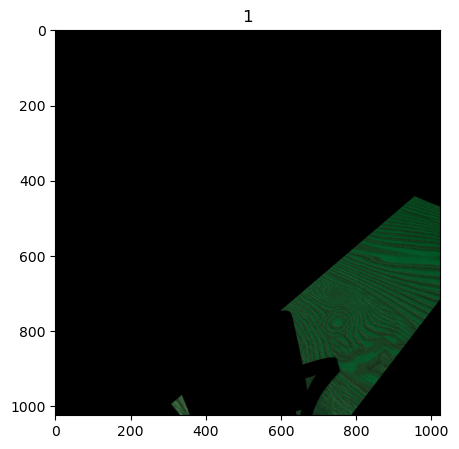

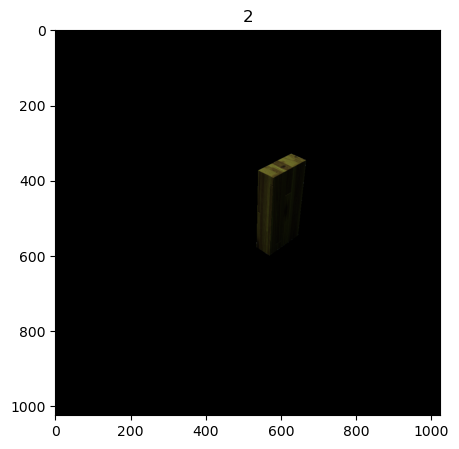

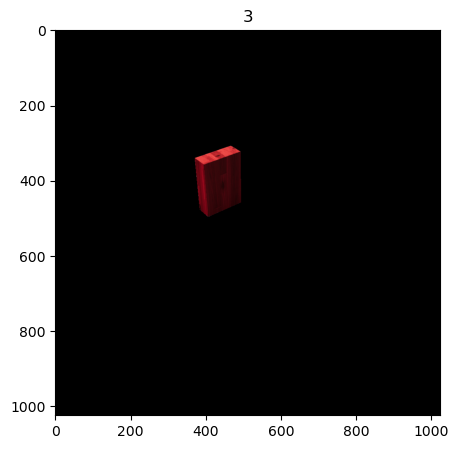

In [6]:
# loop over all seg masks
for o_id, color in zip(object_ids, object_segmentation_colors):
    area = get_mask_area(im_seg, [color])
    image_masked = blackout_image(image, area)
    rgb_masked = image_masked[..., 0:3]

    fig = plt.figure(figsize=[5, 5])
    ax = fig.add_subplot(111)
    ax.imshow(rgb_masked)
    ax.set_title(f"{o_id}")

## visualize the position estimates

In [7]:
STOP_T = 45
o_id = 3

In [8]:
this_obj_gt_positions = []
# for i, positions in enumerate(position_arr):
for i, positions in enumerate(center_arr):
    this_obj_gt_positions.append(positions[o_id-1])
this_obj_gt_positions = np.array(this_obj_gt_positions)
this_obj_gt_positions[STOP_T-1]

array([-0.00261912,  0.05006434, -0.02860672], dtype=float32)

In [9]:
initial_positions[o_id-1]

array([-0.25,  0.  ,  0.  ], dtype=float32)

In [10]:
position_samples_last = np.array([list(sample.values()) for sample in tracking_final_frame['position'][str(o_id)]])
position_samples_last

array([[-0.18176262,  0.05245266, -0.01692668],
       [-0.18098423,  0.05915048, -0.01926793],
       [-0.18664518,  0.05597908, -0.0214103 ],
       [-0.18033838,  0.05760233, -0.01928074],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18220671,  0.05566236, -0.02073563],
       [-0.18033838,  0.05760233, -0.01928074],
       [-0.19251598,  0.05894006, -0.01634839],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18598148,  0.06382339, -0.022695  ],
       [-0.18174432,  0.0586636 , -0.01893486],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18422708,  0.05307205, -0.0154236 ],
       [-0.18315589,  0.05647686, -0.01627763],
       [-0.18799698,  0.06003807, -0.01415965],
       [-0.18350971,  0.05602281, -0.02052242],
       [-0.18315589,  0.05647686, -0.01627763]])

In [11]:
# all frames
rotation_samples = np.array([list(sample.values()) for sample in tracking_final_frame['rotation'][str(o_id)]])
calculated_centers_last = []
for position_sample, rotation_sample in zip(position_samples_last, rotation_samples):
    calculated_center, q = compute_center_of_mass(object_meshes[o_id-1].bounding_box,
        position_sample, rotation_sample)
    calculated_centers_last.append(calculated_center)
calculated_centers_last = np.array(calculated_centers_last)
calculated_centers_last

array([[ 0.00510972,  0.05375812, -0.02668227],
       [ 0.00605657,  0.05818688, -0.02500869],
       [ 0.00027495,  0.05747348, -0.03017259],
       [ 0.00624968,  0.05564054, -0.03339432],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.00446816,  0.05668994, -0.03375806],
       [ 0.00624968,  0.05564054, -0.03339432],
       [-0.00554515,  0.05728802, -0.02391976],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.00080164,  0.05864161, -0.03286164],
       [ 0.00444439,  0.05511455, -0.03735532],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.0023364 ,  0.05465025, -0.02990538],
       [ 0.00360126,  0.05552064, -0.02806732],
       [-0.0016069 ,  0.05648447, -0.0304156 ],
       [ 0.00345549,  0.05351214, -0.02799631],
       [ 0.00360126,  0.05552064, -0.02806732]])

In [12]:
# all frames
position_samples = []
for time_point in tracking_per_frame['pose']:
    try:
        position_samples.append(time_point[str(o_id)][-1][0][:3])
    except:
        continue
position_samples = np.array(position_samples)

In [13]:
# # all frames
# position_samples = np.array([time_point[str(o_id)][-1][0][:3] for time_point in tracking_per_frame['pose']])
# position_samples

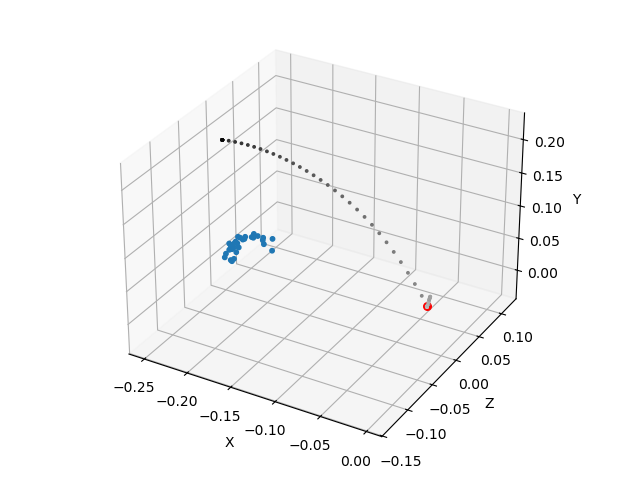

In [14]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_positions))])/len(this_obj_gt_positions)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
ax.scatter(position_samples[:, 0], position_samples[:, 2], position_samples[:, 1], s = 10, alpha=1)
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

In [15]:
calculated_centers = []
for time_point in tracking_per_frame['pose']:
    try:
        calculated_centers.append(time_point[str(o_id)][-1][1])
    except:
        continue
calculated_centers = np.array(calculated_centers)

# calculated_centers = np.array([time_point[str(o_id)][-1][1] for time_point in tracking_per_frame['pose']])
# calculated_centers

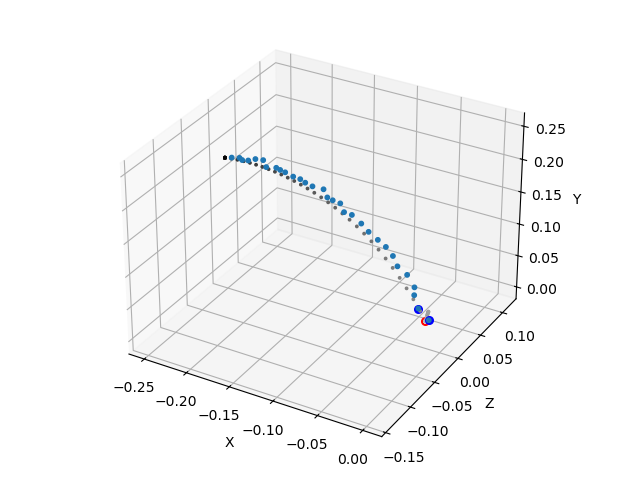

In [16]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_positions))])/len(this_obj_gt_positions)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
ax.scatter(calculated_centers[:, 0], calculated_centers[:, 2], calculated_centers[:, 1], s = 10, alpha=1)
ax.scatter(calculated_centers[-1][0], calculated_centers[-1][2], calculated_centers[-1][1], s = 30, c='blue')
ax.scatter(calculated_centers[-2][0], calculated_centers[-2][2], calculated_centers[-2][1], s = 30, c='blue')
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

In [17]:
t = -1

In [18]:
# # last frame
# position_samples_last = np.array([sample[1][:3] for sample in tracking_per_frame['pose'][t][str(o_id)][0][0]])
# position_samples_last

(array([1., 0., 0., 1., 1., 1., 7., 3., 3., 3.]),
 array([-0.19251598, -0.19129822, -0.19008046, -0.1888627 , -0.18764494,
        -0.18642718, -0.18520942, -0.18399166, -0.1827739 , -0.18155614,
        -0.18033838]),
 <BarContainer object of 10 artists>)

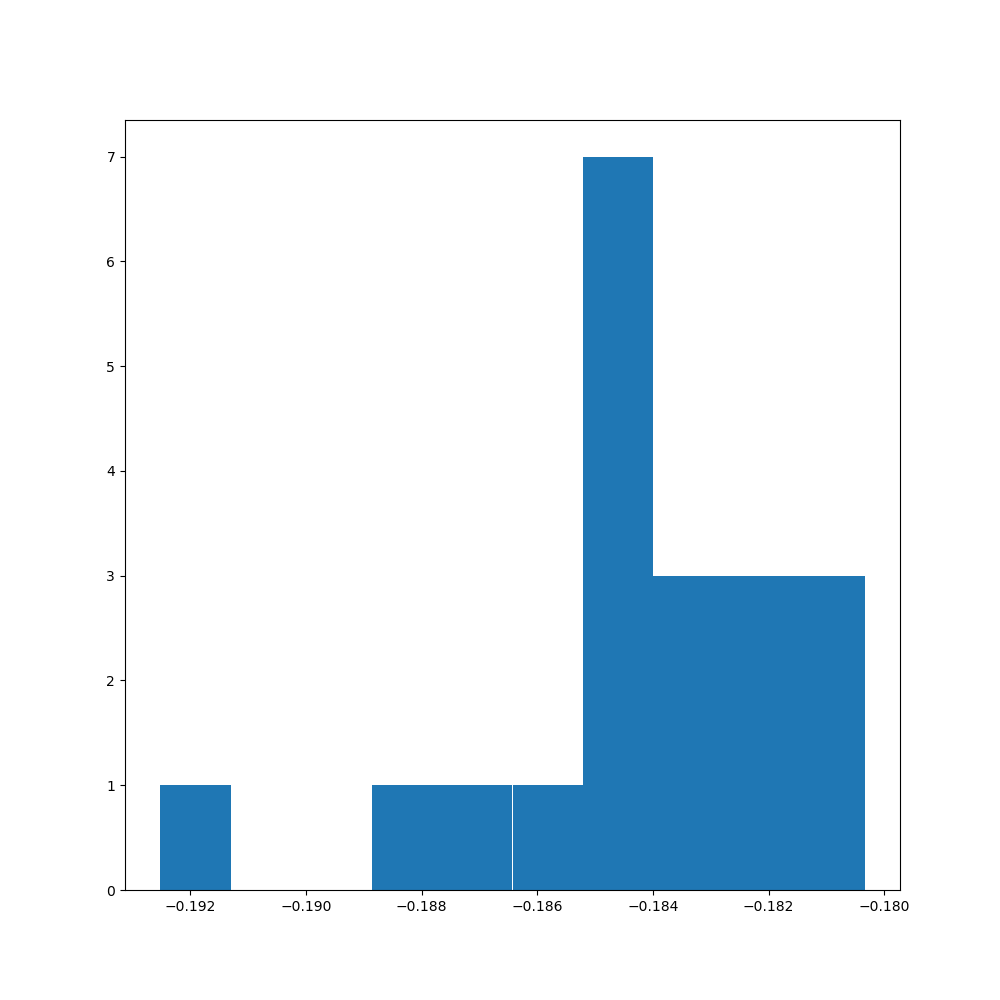

In [19]:
fig = plt.figure(figsize=[10, 10])
plt.hist(position_samples_last[:,0])

Text(0.5, 0, 'Y')

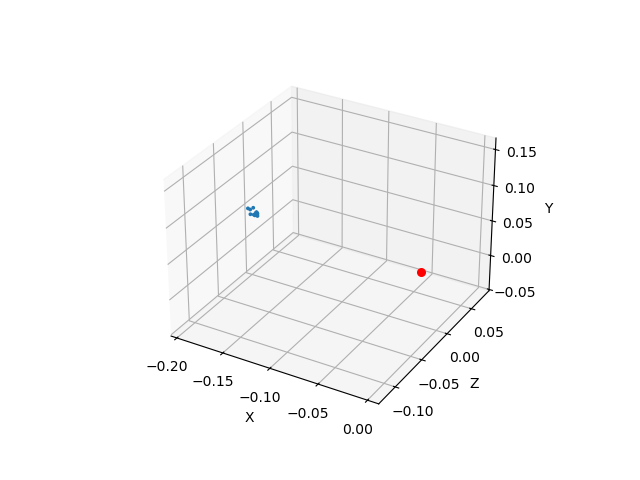

In [20]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

ax.scatter(position_samples_last[:, 0], position_samples_last[:, 2], position_samples_last[:, 1], s = 3, alpha=1)
ax.scatter(this_obj_gt_positions[STOP_T+t][0], this_obj_gt_positions[STOP_T+t][2], this_obj_gt_positions[STOP_T+t][1], s = 30, c='r')
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")

Text(0.5, 0, 'Y')

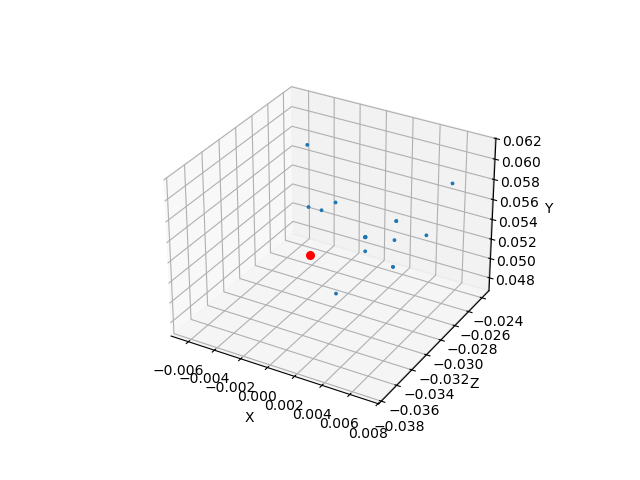

In [21]:
%matplotlib widget
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

ax.scatter(calculated_centers_last[:, 0], calculated_centers_last[:, 2], calculated_centers_last[:, 1], s = 3, alpha=1)
ax.scatter(this_obj_gt_positions[STOP_T+t][0], this_obj_gt_positions[STOP_T+t][2], this_obj_gt_positions[STOP_T+t][1], s = 30, c='r')
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")

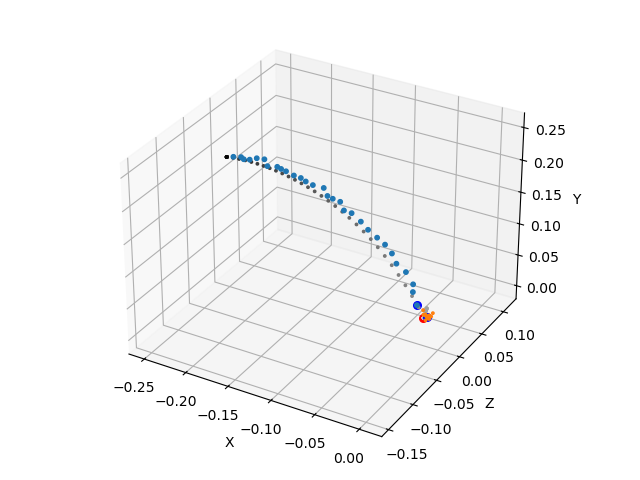

In [22]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_positions))])/len(this_obj_gt_positions)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
ax.scatter(calculated_centers[:, 0], calculated_centers[:, 2], calculated_centers[:, 1], s = 10, alpha=1)
ax.scatter(calculated_centers[-1][0], calculated_centers[-1][2], calculated_centers[-1][1], s = 30, c='blue')
ax.scatter(calculated_centers[-2][0], calculated_centers[-2][2], calculated_centers[-2][1], s = 30, c='blue')
ax.scatter(calculated_centers_last[:, 0], calculated_centers_last[:, 2], calculated_centers_last[:, 1], s = 3, alpha=1)
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

In [25]:
calculated_centers_last_50 = np.array([sample[2] for sample in tracking_per_frame['pose'][t][str(o_id)][0][2]])
calculated_centers_last_50

array([[ 0.0023364 ,  0.05465026, -0.02990538],
       [ 0.00360127,  0.05552064, -0.02806732],
       [ 0.00510972,  0.05375812, -0.02668227],
       [ 0.00345548,  0.05351213, -0.02799631],
       [ 0.00505845,  0.05385922, -0.03318257],
       [-0.00160689,  0.05648447, -0.03041559],
       [ 0.00382824,  0.05504314, -0.03326085],
       [ 0.00624968,  0.05564054, -0.03339432],
       [ 0.00816644,  0.05636089, -0.02478339],
       [ 0.0111958 ,  0.05642119, -0.02272945],
       [ 0.00140012,  0.05545066, -0.03574603],
       [ 0.00097801,  0.05885424, -0.02934107],
       [ 0.00856724,  0.05547612, -0.02229274],
       [-0.00554515,  0.05728803, -0.02391976],
       [ 0.00027496,  0.05747348, -0.03017259],
       [ 0.00551549,  0.05897941, -0.02970837],
       [ 0.00076644,  0.05844112, -0.02880532],
       [ 0.00631855,  0.05743335, -0.02811084],
       [ 0.00411553,  0.05810061, -0.02708492],
       [ 0.01087203,  0.05309683, -0.02276272],
       [-0.0002555 ,  0.05763808, -0.033

Text(0.5, 0, 'Y')

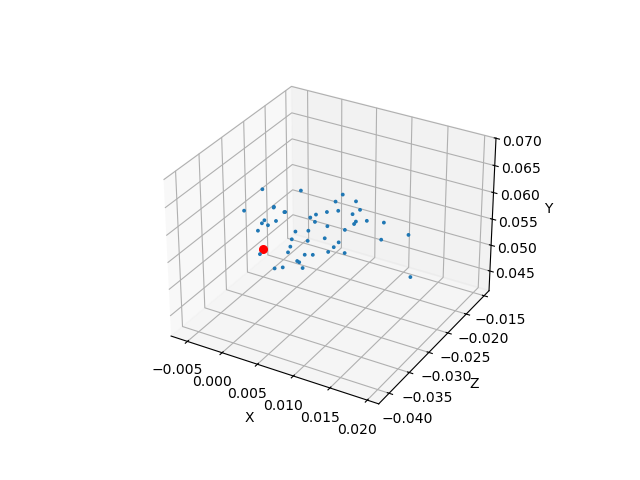

In [26]:
%matplotlib widget
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

ax.scatter(calculated_centers_last_50[:, 0], calculated_centers_last_50[:, 2], calculated_centers_last_50[:, 1], s = 3, alpha=1)
ax.scatter(this_obj_gt_positions[STOP_T+t][0], this_obj_gt_positions[STOP_T+t][2], this_obj_gt_positions[STOP_T+t][1], s = 30, c='r')
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")

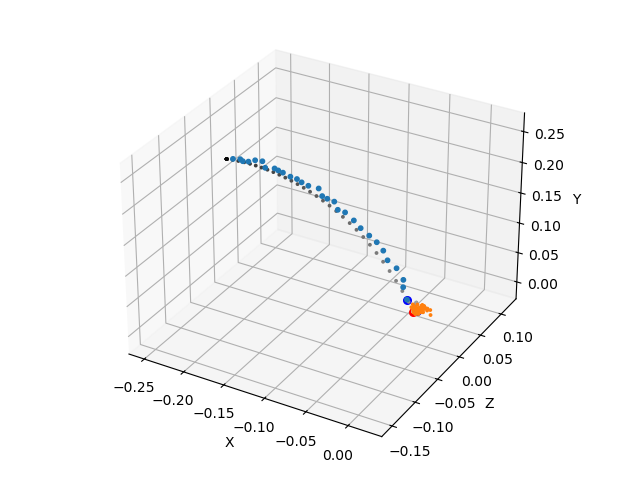

In [27]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_positions))])/len(this_obj_gt_positions)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
ax.scatter(calculated_centers[:, 0], calculated_centers[:, 2], calculated_centers[:, 1], s = 10, alpha=1)
ax.scatter(calculated_centers[-1][0], calculated_centers[-1][2], calculated_centers[-1][1], s = 30, c='blue')
ax.scatter(calculated_centers[-2][0], calculated_centers[-2][2], calculated_centers[-2][1], s = 30, c='blue')
ax.scatter(calculated_centers_last_50[:, 0], calculated_centers_last_50[:, 2], calculated_centers_last_50[:, 1], s = 3, alpha=1)
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

## visualize the rotation

In [36]:
this_obj_gt_rotations = []
this_obj_gt_rotations_q = []
for i, rotations in enumerate(rotation_arr):
    this_obj_gt_rotations.append(quaternion_to_euler_angles(rotations[o_id-1]))
    this_obj_gt_rotations_q.append(rotations[o_id-1])
this_obj_gt_rotations = np.array(this_obj_gt_rotations)
this_obj_gt_rotations_q = np.array(this_obj_gt_rotations_q)
this_obj_gt_rotations

array([[ 5.99306497e-06,  1.14547653e-05, -3.83709699e-05],
       [-6.57216180e-04,  2.01726745e-04,  4.05706784e-03],
       [-8.08542349e-04,  2.95894967e-04,  7.36648532e-03],
       [-5.89460190e-04,  2.23108131e-04,  6.50777257e-03],
       [-3.54391617e-04,  1.38987512e-04,  4.47319693e-03],
       [-1.88448746e-04,  8.80315231e-05,  2.71908382e-03],
       [-8.94795168e-05,  5.08663803e-05,  1.53160902e-03],
       [-1.63067970e-05,  3.26835962e-05,  7.93061185e-04],
       [ 1.72388549e-05,  2.39336442e-05,  3.75323359e-04],
       [ 2.23841070e-05,  1.25021222e-05,  1.59086878e-04],
       [ 1.74027837e-05,  1.31964496e-05,  5.72993835e-05],
       [ 1.13557022e-05,  5.90132648e-06,  6.87356825e-06],
       [ 8.07932667e-06,  1.12427912e-05, -1.19757131e-05],
       [ 6.69119480e-06,  5.14274413e-06, -1.26185020e-05],
       [ 4.83152578e-06,  1.74365615e-05, -1.59413440e-05],
       [-7.36621295e-03,  1.49352800e-03, -1.97940305e+00],
       [-1.29937097e-03, -2.92484679e-02

In [37]:
initial_rotations[o_id-1]

array([0., 0., 0.], dtype=float32)

In [39]:
# all frames
rotation_samples = []
for time_point in tracking_per_frame['pose']:
    try:
        rotation_samples.append(quaternion_to_euler_angles(time_point[str(o_id)][-1][0][3:]))
    except:
        continue
rotation_samples = np.array(rotation_samples)

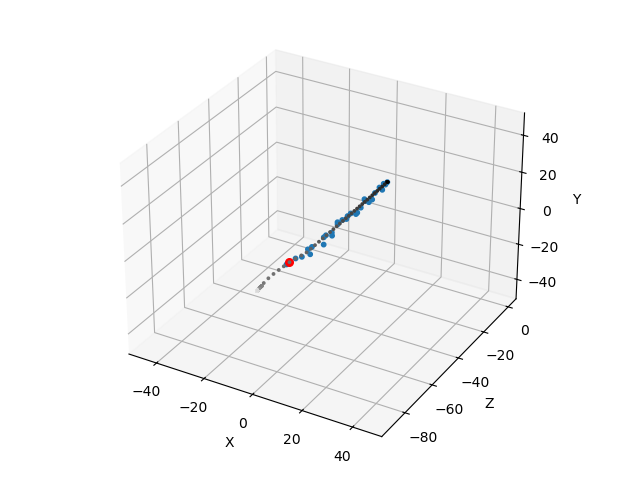

In [40]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_rotations))])/len(this_obj_gt_rotations)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_rotations[:, 0], this_obj_gt_rotations[:, 2], this_obj_gt_rotations[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_rotations[STOP_T-1][0], this_obj_gt_rotations[STOP_T-1][2], this_obj_gt_rotations[STOP_T-1][1], s = 30, c='r')
ax.scatter(rotation_samples[:, 0], rotation_samples[:, 2], rotation_samples[:, 1], s = 10, alpha=1)
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

In [41]:
rotation_samples_last = np.array([quaternion_to_euler_angles(list(sample.values())) for sample in tracking_final_frame['rotation'][str(o_id)]])
rotation_samples_last

array([[ -3.32008787,   5.01261089, -71.83993371],
       [ -4.56558759,  -1.15651004, -63.39600328],
       [  3.10722408,   2.522609  , -71.23412256],
       [  0.467612  ,   4.64475234, -71.89884434],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -4.80598928,  -3.46098055, -74.58094342],
       [  0.467612  ,   4.64475234, -71.89884434],
       [ 11.86678544,  -2.4103811 , -68.71029802],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -0.17986865,  -2.378293  , -70.31099899],
       [  1.24571405,  -4.20955519, -71.02550207],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -5.5860357 ,   3.11361404, -68.89837788],
       [ -5.99095582,   2.2732819 , -70.54160455],
       [ -0.63401828,   4.2122385 , -68.79346924],
       [ -1.34002106,  -0.24415538, -70.15878353],
       [ -5.99095582,   2.27328

In [42]:
# last frame
# rotation_samples_last = np.array([quaternion_to_euler_angles(sample[1][3:]) for sample in tracking_per_frame['pose'][t][str(o_id)][0][0]])
# rotation_samples_last

Text(0.5, 0, 'Y')

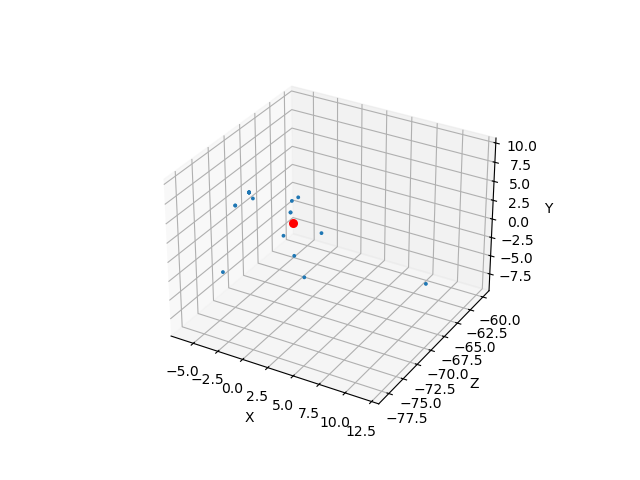

In [43]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.scatter(rotation_samples_last[:, 0], rotation_samples_last[:, 2], rotation_samples_last[:, 1], s = 3, alpha=1)
ax.scatter(this_obj_gt_rotations[STOP_T-1][0], this_obj_gt_rotations[STOP_T-1][2], this_obj_gt_rotations[STOP_T-1][1], s = 30, c='r')
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")

## visualize the velocity

In [26]:
this_obj_gt_velocities = []
for i, velocities in enumerate(velocity_arr):
    this_obj_gt_velocities.append(velocities[o_id-1])
this_obj_gt_velocities = np.array(this_obj_gt_velocities)
this_obj_gt_velocities[STOP_T+t]

array([ 0.54711175, -1.2638288 , -0.08734212], dtype=float32)

In [27]:
this_obj_gt_positions[15:STOP_T]

array([[-0.24184857,  0.1893486 , -0.00096373],
       [-0.23375358,  0.19099936, -0.00190648],
       [-0.22574802,  0.19226813, -0.00283973],
       [-0.21782093,  0.19317369, -0.00375357],
       [-0.20996559,  0.19374076, -0.00471951],
       [-0.20204002,  0.19395204, -0.00565139],
       [-0.19411266,  0.19384237, -0.00656954],
       [-0.18616906,  0.19340532, -0.00747449],
       [-0.17819148,  0.19263302, -0.00838245],
       [-0.17017516,  0.19137913, -0.00929534],
       [-0.16209285,  0.18985018, -0.01021652],
       [-0.1539264 ,  0.18795964, -0.01114872],
       [-0.1456832 ,  0.18566594, -0.01209024],
       [-0.13733804,  0.1829426 , -0.01304309],
       [-0.12889534,  0.1797569 , -0.01400672],
       [-0.12035716,  0.17607024, -0.01499462],
       [-0.11172879,  0.17184044, -0.01600114],
       [-0.1030218 ,  0.1670212 , -0.01702338],
       [-0.09425138,  0.16156161, -0.01801428],
       [-0.08543943,  0.15540585, -0.0189636 ],
       [-0.07663378,  0.14849532, -0.019

In [28]:
calculated_centers

array([[-0.24424832,  0.18713156,  0.0037507 ],
       [-0.23414419,  0.19095649,  0.00260748],
       [-0.22870361,  0.19186281, -0.00101447],
       [-0.21970312,  0.19620188, -0.00387869],
       [-0.21179183,  0.20056334, -0.00286574],
       [-0.2037628 ,  0.20066034, -0.00099422],
       [-0.19726413,  0.19548422, -0.00594685],
       [-0.18670327,  0.19699964, -0.00398715],
       [-0.18021125,  0.19809491, -0.00715271],
       [-0.17601072,  0.19433453, -0.0044837 ],
       [-0.16482212,  0.19390619, -0.00768289],
       [-0.15624351,  0.19359203, -0.00835543],
       [-0.15217086,  0.18796669, -0.00553386],
       [-0.14165229,  0.1886261 , -0.00925323],
       [-0.13035241,  0.18682177, -0.00682147],
       [-0.12271543,  0.18101218, -0.01256266],
       [-0.11659792,  0.17894044, -0.01249554],
       [-0.10947135,  0.17524042, -0.00986723],
       [-0.10116383,  0.16963634, -0.01685022],
       [-0.09394673,  0.16624728, -0.0139378 ],
       [-0.08258269,  0.15829093, -0.015

In [29]:
100*(calculated_centers[-1]-calculated_centers[-2])

array([ 1.39498832, -0.94664521, -0.39268837])

In [30]:
100*(this_obj_gt_positions[STOP_T+t]-this_obj_gt_positions[STOP_T+t-1])

array([ 0.6002337 , -1.302591  , -0.07678177], dtype=float32)

In [31]:
velocity_samples = np.array([list(sample.values()) for sample in tracking_final_frame['velocity'][str(o_id)]])
velocity_samples

array([[ 0.72921102, -1.34067745, -0.04901315],
       [ 0.76077247, -1.19305224,  0.00677272],
       [ 0.56805253, -1.21683181, -0.16535724],
       [ 0.76720977, -1.27792996, -0.27274813],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.70782611, -1.24295004, -0.28487266],
       [ 0.76720977, -1.27792996, -0.27274813],
       [ 0.37404888, -1.22301376,  0.04307058],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.58560887, -1.17789385, -0.25499224],
       [ 0.70703369, -1.29546269, -0.40478161],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.63676722, -1.3109394 , -0.15645021],
       [ 0.67892957, -1.28192678, -0.09518142],
       [ 0.50532413, -1.24979885, -0.17345717],
       [ 0.67406983, -1.34887692, -0.09281443],
       [ 0.67892957, -1.28192678, -0.09518142]])

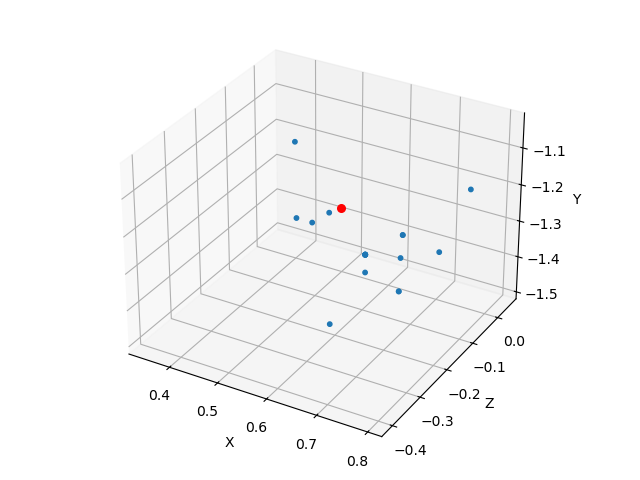

In [32]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_velocities))])/len(this_obj_gt_velocities)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_velocities[STOP_T-1][0], this_obj_gt_velocities[STOP_T-1][2], this_obj_gt_velocities[STOP_T-1][1], s = 30, c='r')
ax.scatter(velocity_samples[:, 0], velocity_samples[:, 2], velocity_samples[:, 1], s = 10, alpha=1)
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

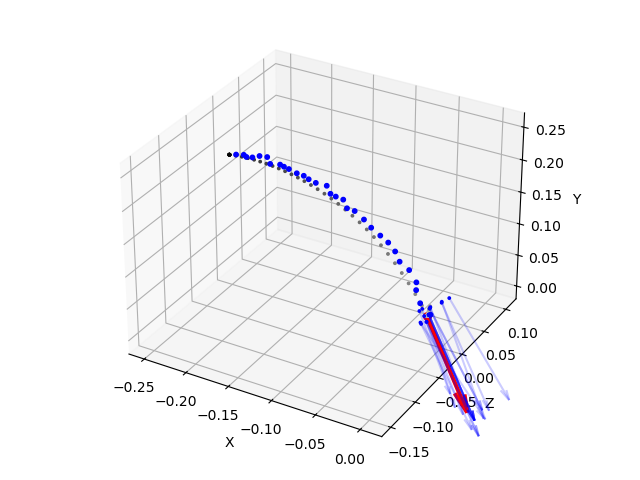

In [33]:

%matplotlib widget
# calculated_centers_last = np.array([sample[2] for sample in tracking_per_frame['pose'][t][str(o_id)][0][0]])
velocity_samples = np.array([list(sample.values()) for sample in tracking_final_frame['velocity'][str(o_id)]])

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_positions))])/len(this_obj_gt_positions)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
ax.scatter(calculated_centers[:, 0], calculated_centers[:, 2], calculated_centers[:, 1], s = 10, alpha=1, c='blue')
ax.scatter(calculated_centers_last[:, 0], calculated_centers_last[:, 2], calculated_centers_last[:, 1], s = 3, alpha=1, c='blue')

ax.quiver(calculated_centers_last[:, 0][:velocity_samples.shape[0]], calculated_centers_last[:, 2][:velocity_samples.shape[0]], calculated_centers_last[:, 1][:velocity_samples.shape[0]], calculated_centers_last[:, 0][:velocity_samples.shape[0]]+velocity_samples[:, 0], calculated_centers_last[:, 2][:velocity_samples.shape[0]]+velocity_samples[:, 2], calculated_centers_last[:, 1][:velocity_samples.shape[0]]+velocity_samples[:, 1], color='blue', arrow_length_ratio=0.1, length=0.1, alpha=0.2)
ax.quiver(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], this_obj_gt_positions[STOP_T-1][0]+this_obj_gt_velocities[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2]+this_obj_gt_velocities[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1]+this_obj_gt_velocities[STOP_T-1][1], color='red', arrow_length_ratio=0.2, length=0.1, linewidths=3.0, alpha=1)

set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")

set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()


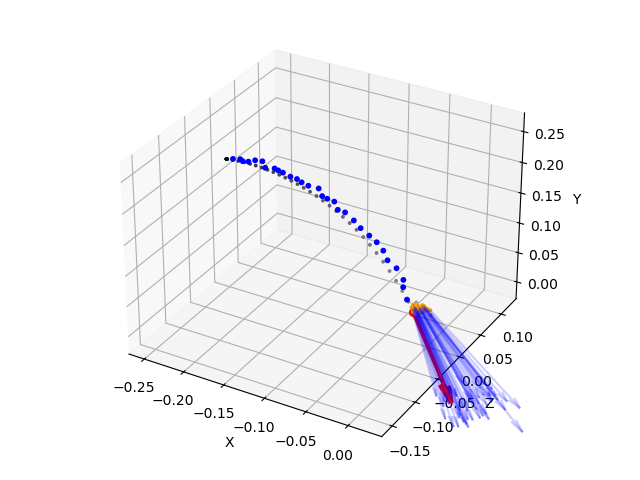

In [36]:
%matplotlib widget

window_size = 3
velocity_samples = 100*(calculated_centers_last_50-calculated_centers[-(window_size+1)])/window_size

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_positions))])/len(this_obj_gt_positions)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, cmap = grayscale_map, c=colors)
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
ax.scatter(calculated_centers[:, 0], calculated_centers[:, 2], calculated_centers[:, 1], s = 10, alpha=1, c='blue')
ax.scatter(calculated_centers_last_50[:, 0], calculated_centers_last_50[:, 2], calculated_centers_last_50[:, 1], s = 3, alpha=1, c='orange')

ax.quiver(calculated_centers_last_50[:, 0][:velocity_samples.shape[0]], calculated_centers_last_50[:, 2][:velocity_samples.shape[0]], calculated_centers_last_50[:, 1][:velocity_samples.shape[0]], calculated_centers_last_50[:, 0][:velocity_samples.shape[0]]+velocity_samples[:, 0], calculated_centers_last_50[:, 2][:velocity_samples.shape[0]]+velocity_samples[:, 2], calculated_centers_last_50[:, 1][:velocity_samples.shape[0]]+velocity_samples[:, 1], color='blue', arrow_length_ratio=0.1, length=0.1, alpha=0.2)
ax.quiver(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], this_obj_gt_positions[STOP_T-1][0]+this_obj_gt_velocities[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2]+this_obj_gt_velocities[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1]+this_obj_gt_velocities[STOP_T-1][1], color='red', arrow_length_ratio=0.2, length=0.1, linewidths=3.0, alpha=1)

set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")

set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()


# verify if the biased velocity is due to the wrong rotations inferred by b3d

## verify if the compute_center_of_mass function is correct or not

In [10]:
PLOTS_PER_ROW = 3
window_size = 3
fps = 100

In [18]:
calculated_centers = []
for i in range(STOP_T):
    calculated_center, q = compute_center_of_mass(object_meshes[o_id-1].bounding_box,
        this_obj_gt_positions[i], this_obj_gt_rotations_q[i])
    calculated_centers.append(calculated_center)
calculated_centers = np.array(calculated_centers)
calculated_centers

NameError: name 'this_obj_gt_rotations_q' is not defined

In [69]:
this_obj_gt_centers = []
for i, centers in enumerate(center_arr):
    # if i >= STOP_T:
    #     continue
    this_obj_gt_centers.append(centers[o_id-1])
this_obj_gt_centers = np.array(this_obj_gt_centers)
this_obj_gt_centers

array([[ 4.99999702e-01,  2.50000060e-01, -6.51300525e-09],
       [ 4.99999583e-01,  2.50000030e-01,  2.15007923e-08],
       [ 4.99999523e-01,  2.50000030e-01,  4.60210856e-08],
       [ 4.99999523e-01,  2.50000030e-01,  4.16450341e-08],
       [ 4.99999493e-01,  2.50000030e-01,  2.93769524e-08],
       [ 4.99999523e-01,  2.50000030e-01,  1.76765003e-08],
       [ 4.99999493e-01,  2.50000030e-01,  3.14869801e-08],
       [ 4.99999493e-01,  2.50000030e-01,  1.87425826e-08],
       [ 4.99999493e-01,  2.50000030e-01,  3.68892366e-08],
       [ 4.99999493e-01,  2.50000030e-01,  2.66920424e-08],
       [ 4.99999493e-01,  2.50000030e-01,  1.57204134e-08],
       [ 4.99999523e-01,  2.50000030e-01,  3.19319220e-08],
       [ 4.99999493e-01,  2.50000030e-01,  2.37629436e-08],
       [ 4.99999493e-01,  2.50000030e-01,  1.53472932e-08],
       [ 5.39558232e-01,  2.58830875e-01,  4.78507672e-03],
       [ 5.71949184e-01,  2.73565978e-01,  1.00300116e-02],
       [ 6.06481314e-01,  2.81828940e-01

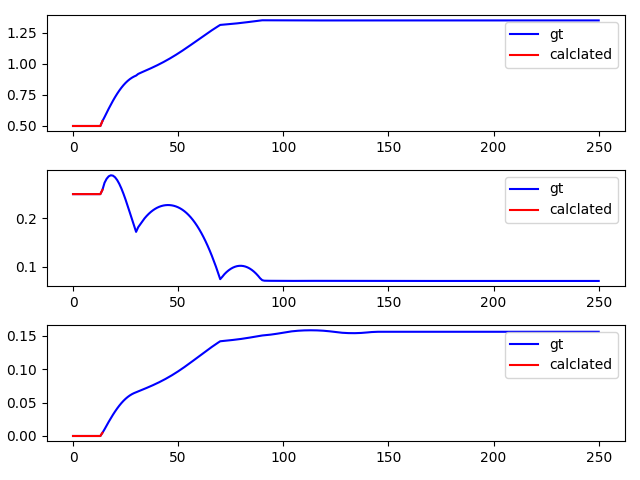

In [70]:
fig, axs = plt.subplots(PLOTS_PER_ROW)
for dim in range(PLOTS_PER_ROW):
    axs[dim].plot(this_obj_gt_centers[:,dim], 'blue', label='gt')
    axs[dim].plot(calculated_centers[:,dim], 'red', label='calclated')
    axs[dim].legend()
plt.tight_layout()

## test the influence of inferred positions by b3d on calculated center of mass

In [71]:
calculated_centers = []
for i in range(STOP_T):
    calculated_center, q = compute_center_of_mass(object_meshes[o_id-1].bounding_box,
        tracking_per_frame['pose'][i][str(o_id)][1][0], this_obj_gt_rotations_q[i])
    calculated_centers.append(calculated_center)
calculated_centers = np.array(calculated_centers)
calculated_centers

array([[0.49610541, 0.23777992, 0.01076794],
       [0.49610531, 0.23777993, 0.010768  ],
       [0.49610524, 0.23777993, 0.01076804],
       [0.49610523, 0.23777994, 0.01076804],
       [0.49610523, 0.23777994, 0.01076804],
       [0.49610523, 0.23777994, 0.01076803],
       [0.49610523, 0.23777995, 0.01076805],
       [0.49610523, 0.23777995, 0.01076804],
       [0.49610523, 0.23777995, 0.01076806],
       [0.49610523, 0.23777996, 0.01076806],
       [0.49610523, 0.23777996, 0.01076805],
       [0.49610523, 0.23777997, 0.01076808],
       [0.49610523, 0.23777997, 0.01076808],
       [0.49610523, 0.23777997, 0.01076807],
       [0.54575337, 0.26702893, 0.00787629]])

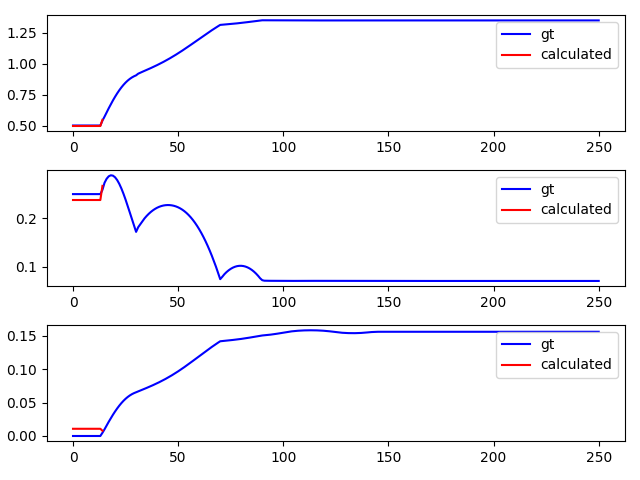

In [72]:
fig, axs = plt.subplots(PLOTS_PER_ROW)
for dim in range(PLOTS_PER_ROW):
    axs[dim].plot(this_obj_gt_centers[:,dim], 'blue', label='gt')
    axs[dim].plot(calculated_centers[:,dim], 'red', label='calculated')
    axs[dim].legend()
plt.tight_layout()

## test the influence of inferred rotations by b3d on calculated center of mass

In [73]:
calculated_centers = []
for i in range(STOP_T):
    calculated_center, q = compute_center_of_mass(object_meshes[o_id-1].bounding_box,
        this_obj_gt_positions[i], tracking_per_frame['pose'][i][str(o_id)][1][1])
    calculated_centers.append(calculated_center)
calculated_centers = np.array(calculated_centers)
calculated_centers

array([[ 0.4944103 ,  0.24989132, -0.00480797],
       [ 0.49441027,  0.24989129, -0.004808  ],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.4944103 ,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.4944103 ,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.4944103 ,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.49441027,  0.24989129, -0.00480801],
       [ 0.50252478,  0.26044319,  0.01833472]])

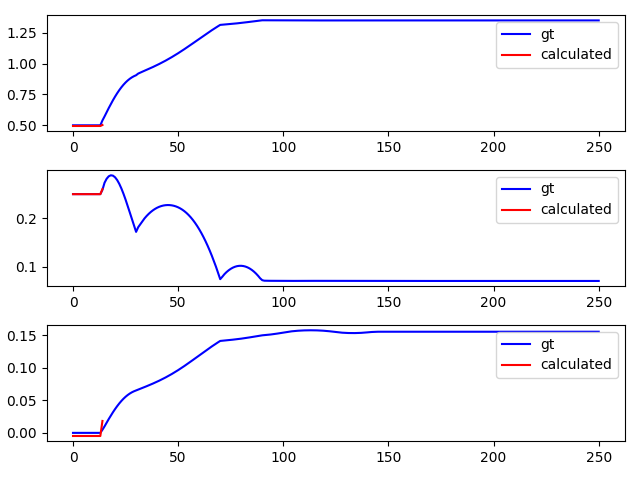

In [74]:
fig, axs = plt.subplots(PLOTS_PER_ROW)
for dim in range(PLOTS_PER_ROW):
    axs[dim].plot(this_obj_gt_centers[:,dim], 'blue', label='gt')
    axs[dim].plot(calculated_centers[:,dim], 'red', label='calculated')
    axs[dim].legend()
plt.tight_layout()

## test the influence of both inferred positions and rotations by b3d on calculated center of mass

In [75]:
calculated_centers = []
for i in range(STOP_T):
    calculated_center, q = compute_center_of_mass(object_meshes[o_id-1].bounding_box,
        tracking_per_frame['pose'][i][str(o_id)][1][0], tracking_per_frame['pose'][i][str(o_id)][1][1])
    calculated_centers.append(calculated_center)
calculated_centers = np.array(calculated_centers)
calculated_centers

array([[0.490516  , 0.23767119, 0.00595997],
       [0.490516  , 0.23767119, 0.00595998],
       [0.490516  , 0.2376712 , 0.00595998],
       [0.490516  , 0.2376712 , 0.00595999],
       [0.490516  , 0.2376712 , 0.00596   ],
       [0.490516  , 0.23767121, 0.00596   ],
       [0.490516  , 0.23767121, 0.00596001],
       [0.490516  , 0.23767121, 0.00596001],
       [0.490516  , 0.23767122, 0.00596002],
       [0.490516  , 0.23767122, 0.00596002],
       [0.490516  , 0.23767123, 0.00596003],
       [0.490516  , 0.23767123, 0.00596003],
       [0.490516  , 0.23767123, 0.00596004],
       [0.490516  , 0.23767124, 0.00596005],
       [0.5087199 , 0.26864123, 0.02142594]])

/tmp/ipykernel_2989465/843135896.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(PLOTS_PER_ROW)


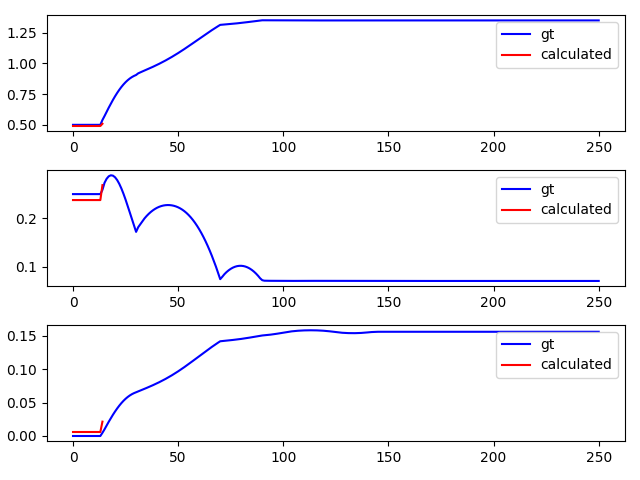

In [76]:
fig, axs = plt.subplots(PLOTS_PER_ROW)
for dim in range(PLOTS_PER_ROW):
    axs[dim].plot(this_obj_gt_centers[:,dim], 'blue', label='gt')
    axs[dim].plot(calculated_centers[:,dim], 'red', label='calculated')
    axs[dim].legend()
plt.tight_layout()

## verify if the center of mass is used to calculate velocity by using gt positions and rotations

In [77]:
linear_vels = []
for i in range(STOP_T):
    if i<window_size:
        continue
    linear_vel, angular_vel = compute_velocity(object_meshes[o_id-1],
        this_obj_gt_positions[i], this_obj_gt_rotations_q[i],
        this_obj_gt_positions[i-window_size], this_obj_gt_rotations_q[i-window_size],
        window_size/fps)
    linear_vels.append(linear_vel)
linear_vels = np.array(linear_vels)
linear_vels

array([[-3.11354590e-06, -9.93409468e-07,  1.73199234e-07],
       [-1.32543037e-06,  2.33146835e-13, -1.24201041e-07],
       [ 7.60914422e-07,  4.71844785e-14, -5.63446836e-07],
       [-9.00080271e-07,  2.31296463e-14, -1.17183148e-07],
       [ 1.87981297e-08,  1.38777878e-14, -1.96456766e-07],
       [-8.86694364e-07, -2.77555756e-14,  3.70707940e-07],
       [-6.43011755e-08,  8.32667268e-15, -1.12041073e-07],
       [ 1.59113870e-08,  5.55111512e-15,  2.13204800e-08],
       [ 8.98679858e-07,  7.40148683e-15, -1.45817466e-07],
       [-2.48557841e-09,  1.85037171e-15, -7.30326699e-08],
       [-2.38268016e-08,  3.70074342e-15,  4.91138645e-08],
       [ 7.66702689e-01,  3.31500712e-01,  1.00392003e-01]])

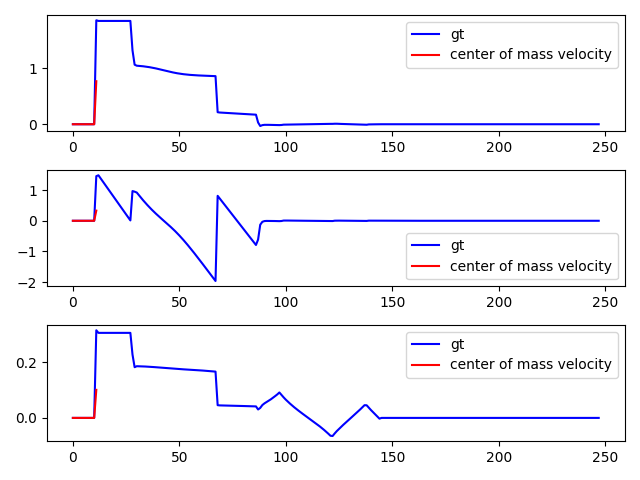

In [78]:
fig, axs = plt.subplots(PLOTS_PER_ROW)
for dim in range(PLOTS_PER_ROW):
    axs[dim].plot(this_obj_gt_velocities[:,dim][window_size:], 'blue', label='gt')
    axs[dim].plot(linear_vels[:,dim], 'red', label='center of mass velocity')
    axs[dim].legend()
plt.tight_layout()

## check velocities computed using gt positions and rotations against positions and rotations inferred from b3d

In [79]:
linear_vels_inferred = []
for i in range(STOP_T):
    if i<window_size:
        continue
    linear_vel, angular_vel = compute_velocity(object_meshes[o_id-1],
        tracking_per_frame['pose'][i][str(o_id)][1][0], tracking_per_frame['pose'][i][str(o_id)][1][1],
        tracking_per_frame['pose'][i-window_size][str(o_id)][1][0], tracking_per_frame['pose'][i-window_size][str(o_id)][1][1],
        window_size/fps)
    linear_vels_inferred.append(linear_vel)
linear_vels_inferred = np.array(linear_vels_inferred)
linear_vels_inferred

array([[0.00000000e+00, 3.72529030e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529029e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529029e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529030e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529030e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529031e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529030e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529029e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529029e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529029e-07, 5.58793545e-07],
       [0.00000000e+00, 3.72529030e-07, 5.58793545e-07],
       [5.78946207e-01, 1.04078826e+00, 1.50459103e-01]])

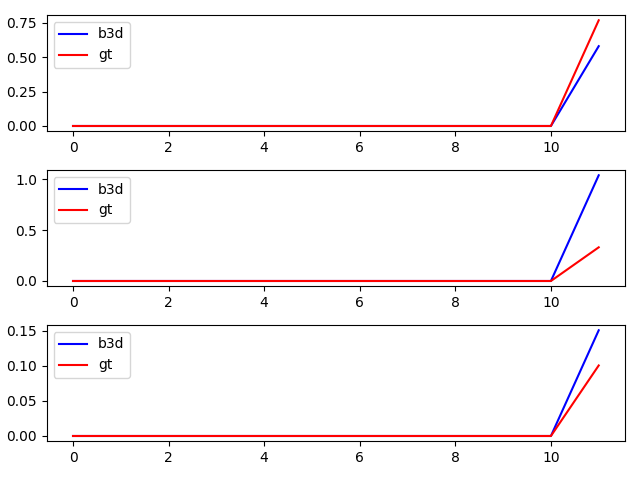

In [80]:
fig, axs = plt.subplots(PLOTS_PER_ROW)
for dim in range(PLOTS_PER_ROW):
    axs[dim].plot(linear_vels_inferred[:,dim], 'blue', label='b3d')
    axs[dim].plot(linear_vels[:,dim], 'red', label='gt')
    axs[dim].legend()
plt.tight_layout()

# visualize 20 room simulation

In [8]:
from tdw.controller import Controller
from tdw.librarian import SceneLibrarian
from tdw_physics.noisy_utils import combine_dicts
import operator
from matplotlib import cm
from matplotlib.animation import FuncAnimation

In [49]:
if "scenes.json" not in Controller.SCENE_LIBRARIANS:
    Controller.SCENE_LIBRARIANS["scenes.json"] = SceneLibrarian()
scene = "mm_kitchen_1b_4x5"
scene_record = Controller.SCENE_LIBRARIANS["scenes.json"].get_record(scene)

if scene == 'mm_kitchen_1b_4x5':
    base_scene_record = Controller.SCENE_LIBRARIANS["scenes.json"].get_record('mm_kitchen_1b')
elif scene == 'box_room_4x5':
    base_scene_record = Controller.SCENE_LIBRARIANS["scenes.json"].get_record('box_room_2018')
elif scene == 'tdw_room_4x5':
    base_scene_record = Controller.SCENE_LIBRARIANS["scenes.json"].get_record('tdw_room')
base_room_center =  {'x':base_scene_record.rooms[0].main_region.center[0], 'y':base_scene_record.rooms[0].main_region.center[1], 'z':base_scene_record.rooms[0].main_region.center[2]}

num_sim = 20

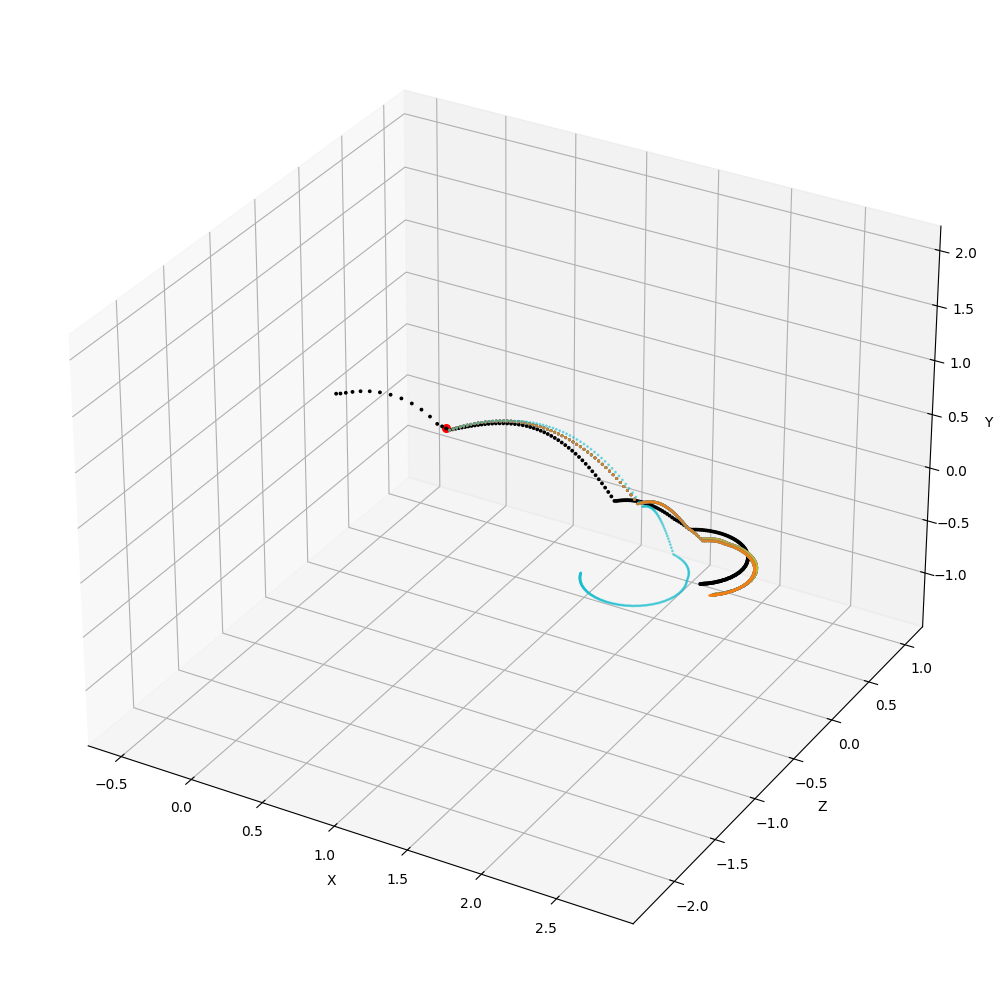

In [50]:
%matplotlib widget

fig = plt.figure(figsize=[10, 10])
ax = fig.add_subplot(111, projection="3d")

ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, c='black')
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 30, c='r')
# ax.scatter(position_samples[:, 0], position_samples[:, 2], position_samples[:, 1], s = 10, alpha=1)

trj_all = {x: [] for x in range(num_sim)}
h5_file = h5py.File(file_4x5, 'r')  
with h5_file as f:
    object_of_interest = o_id-1
    object_of_interest *= num_sim
    frames = list(f['frames'])
    for frame in frames:
        for i, room in enumerate(scene_record.rooms):
            id = object_of_interest+i
            pos = f[f'frames/{frame}/objects/positions'][:][id, :]
            pos = {'x':pos[0], 'y':pos[1], 'z':pos[2]}
            this_room_center = {'x':room.main_region.center[0], 'y':0, 'z':room.main_region.center[2]}
            center = combine_dicts(this_room_center, base_room_center, operator.sub)
            pos = combine_dicts(pos, center, operator.sub)
            trj_all[i].append(list(pos.values()))
trj_all = {key: np.array(value) for key, value in trj_all.items()}
for key, trj in trj_all.items():
    ax.scatter(trj[:, 0], trj[:, 2], trj[:, 1], label=str(key), s = 1, alpha=0.5)
    
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

In [51]:
from IPython.display import Video
Video(f'/ccn2/u/rmvenkat/data/testing_physion/regenerate_from_old_commit/test_humans_consolidated/lf_0/collide_all_movies/{config}_{trial_index.zfill(4)}_img.mp4', width=512, height=512, embed=True) 

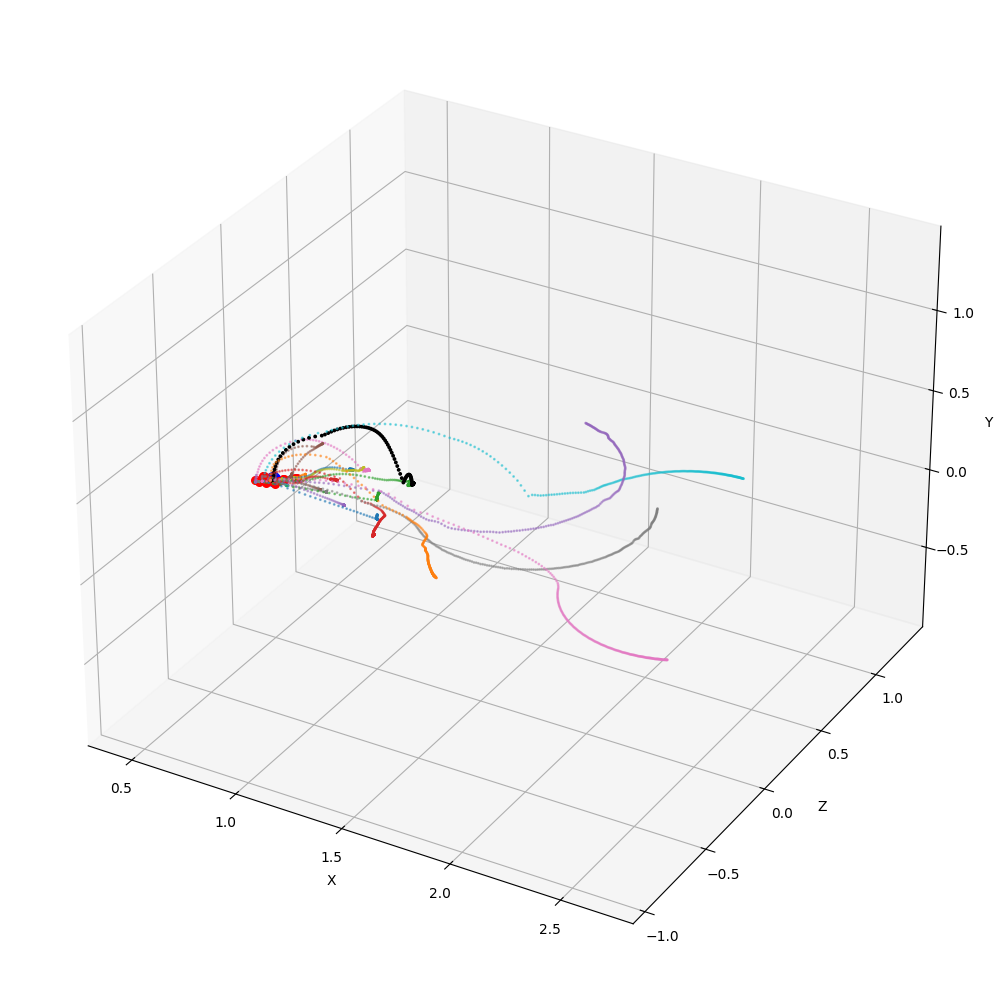

In [85]:
%matplotlib widget
file_4x5_old = f'/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/collide/{config}/{trial_index.zfill(4)}.hdf5'


fig = plt.figure(figsize=[10, 10])
ax = fig.add_subplot(111, projection="3d")
ax.scatter(this_obj_gt_positions[:, 0], this_obj_gt_positions[:, 2], this_obj_gt_positions[:, 1], s = 3, alpha=1, c='black')
ax.scatter(this_obj_gt_positions[STOP_T-1][0], this_obj_gt_positions[STOP_T-1][2], this_obj_gt_positions[STOP_T-1][1], s = 100, c='blue')

trj_all = {x: [] for x in range(num_sim)}
h5_file = h5py.File(file_4x5_old, 'r')  
with h5_file as f:
    object_of_interest = o_id-1
    object_of_interest *= num_sim
    frames = list(f['frames'])
    for frame in frames:
        for i, room in enumerate(scene_record.rooms):
            id = object_of_interest+i
            pos = f[f'frames/{frame}/objects/positions'][:][id, :]
            pos = {'x':pos[0], 'y':pos[1], 'z':pos[2]}
            this_room_center = {'x':room.main_region.center[0], 'y':0, 'z':room.main_region.center[2]}
            # print(this_room_center)
            center = combine_dicts(this_room_center, base_room_center, operator.sub)
            pos = combine_dicts(pos, center, operator.sub)
            trj_all[i].append(list(pos.values()))
trj_all = {key: np.array(value) for key, value in trj_all.items()}
for key, trj in trj_all.items():
    ax.scatter(trj[:, 0], trj[:, 2], trj[:, 1], label=str(key), s = 1, alpha=0.5)
    ax.scatter(trj[STOP_T-1][0], trj[STOP_T-1][2], trj[STOP_T-1][1], s = 30, c='r')

set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

(array([2., 0., 1., 1., 2., 0., 1., 3., 1., 1., 0., 0., 3., 2., 1., 0., 0.,
        0., 1., 1.]),
 array([0.4503665 , 0.45672898, 0.46309147, 0.46945395, 0.47581644,
        0.48217893, 0.48854141, 0.4949039 , 0.50126638, 0.50762887,
        0.51399136, 0.52035384, 0.52671633, 0.53307881, 0.5394413 ,
        0.54580379, 0.55216627, 0.55852876, 0.56489124, 0.57125373,
        0.57761621]),
 <BarContainer object of 20 artists>)

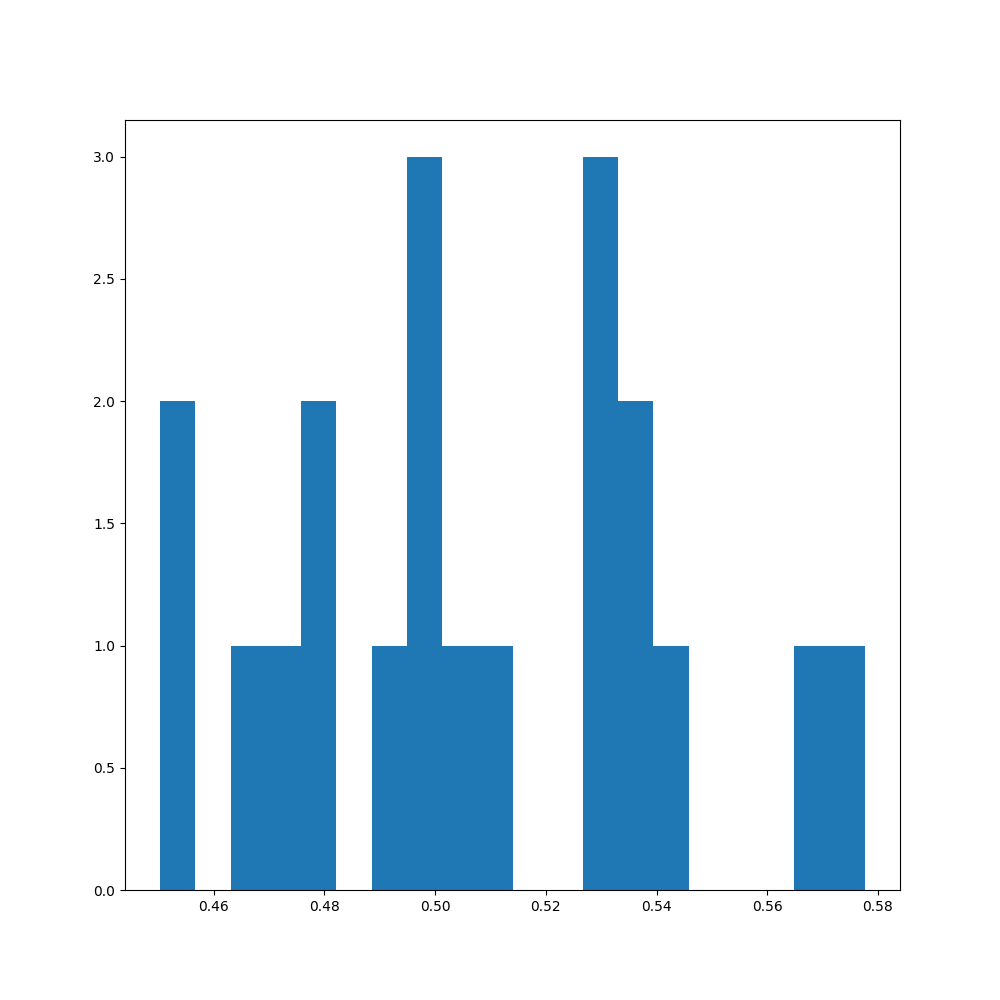

In [86]:
xs = []
zs = []
for key, trj in trj_all.items():
    xs.append(trj[STOP_T-1][0])
    zs.append(trj[STOP_T-1][2])
fig = plt.figure(figsize=[10, 10])
plt.hist(xs, bins=20)

## animation

/tmp/ipykernel_2989465/3746523051.py:30: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatters.append(ax.scatter([], [], s=small_size, c=value))


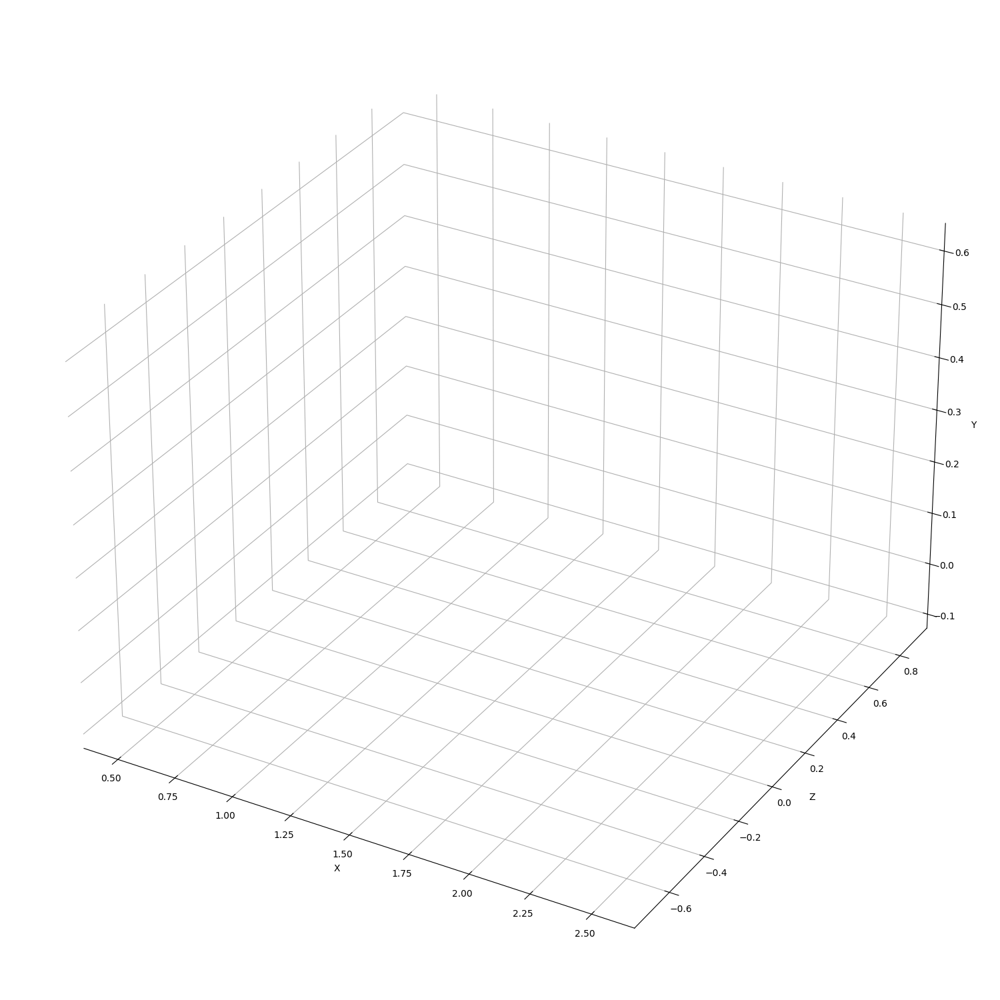

In [87]:
%matplotlib widget

trj_all = {x: [] for x in range(num_sim)}
h5_file = h5py.File(file_4x5, 'r')  
with h5_file as f:
    object_of_interest = o_id-1
    object_of_interest *= num_sim
    frames = list(f['frames'])
    for frame in frames:
        for i, room in enumerate(scene_record.rooms):
            id = object_of_interest+i
            pos = f[f'frames/{frame}/objects/positions'][:][id, :]
            pos = {'x':pos[0], 'y':pos[1], 'z':pos[2]}
            this_room_center = {'x':room.main_region.center[0], 'y':0, 'z':room.main_region.center[2]}
            # print(this_room_center)
            center = combine_dicts(this_room_center, base_room_center, operator.sub)
            pos = combine_dicts(pos, center, operator.sub)
            trj_all[i].append(list(pos.values()))
trj_all = {key: np.array(value) for key, value in trj_all.items()}

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection="3d")
colors = cm.rainbow(np.linspace(0, 1, len(trj_all)))
colors = dict([[k, colors[i]] for i, k in enumerate(trj_all.keys())])
large_size = 20
small_size = 3

scatters = [ax.scatter([], [], s=large_size, c='black'), ax.scatter([], [], s=large_size, c='blue')]
for key, value in colors.items():
    scatters.append(ax.scatter([], [], s=small_size, c=value))

def animate(i):
    scatter_gt = scatters[0]
    accu_trj = (this_obj_gt_positions[:i][:,0], this_obj_gt_positions[:i][:,2], this_obj_gt_positions[:i][:,1])
    scatter_gt._offsets3d = (accu_trj)
    if i < STOP_T:
        scatter_track = scatters[1]
        accu_trj = (position_samples[:i][:,0], position_samples[:i][:,2], position_samples[:i][:,1])
        scatter_track._offsets3d = (accu_trj)
    else:
        for j, trj in trj_all.items():
            scatter = scatters[j+2]
            accu_trj = (trj[:i-STOP_T+1][:,0], trj[:i-STOP_T+1][:,2], trj[:i-STOP_T+1][:,1])
            scatter._offsets3d = (accu_trj)

ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
xyz = np.vstack(list(trj_all.values())+[this_obj_gt_positions, position_samples])
xs = xyz[:,0]
ys = xyz[:,1]
zs = xyz[:,2]
xmax = np.max(xs)
xmin = np.min(xs)
ymax = np.max(ys)
ymin = np.min(ys)
zmax = np.max(zs)
zmin = np.min(zs)
ax.set_xlim(xmin-0.1,xmax+0.1)
ax.set_ylim(zmin-0.1,zmax+0.1)
ax.set_zlim(ymin-0.1,ymax+0.1)
# ax.set_title(title)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')

anim = FuncAnimation(fig, animate, frames=len(trj_all[0]), interval=100, repeat=False)

plt.tight_layout()
plt.show()
# anim.save("/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/test_20rooms/test.gif", writer="pillow")


## visualize the angular velocity

In [88]:
this_obj_gt_angular_velocities = []
for i, angular_velocities in enumerate(angular_velocity_arr):
    this_obj_gt_angular_velocities.append(angular_velocities[o_id-1])
this_obj_gt_angular_velocities = np.array(this_obj_gt_angular_velocities)
this_obj_gt_angular_velocities[STOP_T-1]

array([1.8530127 , 1.4549693 , 0.31354338], dtype=float32)

In [89]:
angular_velocity_samples = np.array([list(sample.values()) for sample in tracking_final_frame['angular_velocity'][str(o_id)]])
angular_velocity_samples

array([[  0.        ,   0.        ,   0.        ],
       [  0.76591574,   2.41785242,   2.95367732],
       [ -2.10243122,  31.61021493,   1.61063349],
       [  0.49346817,   2.06764263,  -2.06071173],
       [  1.91822905, -10.97790929,  -0.40058042],
       [  1.91822905, -10.97790929,  -0.40058042],
       [  1.91822905, -10.97790929,  -0.40058042],
       [ -3.23789188,   8.63060153,   0.29012477],
       [  0.49346817,   2.06764263,  -2.06071173],
       [ -0.14967201,  15.77576553,   1.7693866 ],
       [  1.91822905, -10.97790929,  -0.40058042],
       [  0.44233427,  -0.65833162,  -2.40091632],
       [ -1.0505197 ,   1.69127911,  -5.30798868],
       [  1.91822905, -10.97790929,  -0.40058042],
       [  1.91822905, -10.97790929,  -0.40058042],
       [  1.91822905, -10.97790929,  -0.40058042],
       [ -0.61456601,  17.62507626,  -2.17361473],
       [  0.15070757,   8.13798817,   0.27803488],
       [  2.57414277,  -8.12980363,   0.21739676],
       [ -0.61456601,  17.62507

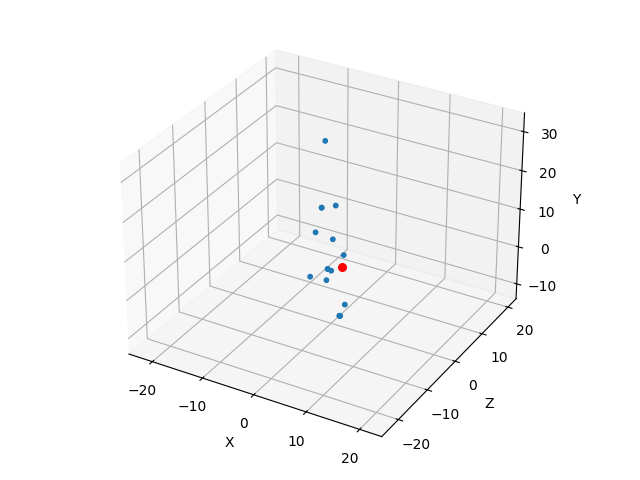

In [90]:
%matplotlib widget

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

colors = 1.*np.array([i for i in range(len(this_obj_gt_angular_velocities))])/len(this_obj_gt_angular_velocities)
grayscale_map = plt.get_cmap('gray')
ax.scatter(this_obj_gt_angular_velocities[STOP_T-1][0], this_obj_gt_angular_velocities[STOP_T-1][2], this_obj_gt_angular_velocities[STOP_T-1][1], s = 30, c='r')
ax.scatter(angular_velocity_samples[:, 0], angular_velocity_samples[:, 2], angular_velocity_samples[:, 1], s = 10, alpha=1)
set_axes_equal(ax)
ax.set_xlabel("X")
ax.set_ylabel("Z")
ax.set_zlabel("Y")
plt.tight_layout()

# ground truth debugging

## making all information ground truth and with no collision noise

In [2]:
num_sim = 20
XYZ = ['x', 'y', 'z']
XYZW = ['x', 'y', 'z', 'w']
STOP_T = 15

path = '/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/b3d_tracking_results/first_scale/gt_all_info_0.01_std/'
onlyjson = [
    f
    for f in listdir(path)
    if isfile(join(path, f)) and join(path, f).endswith(".json")
]
onlyjson

['pilot_it2_collision_non-sphere_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_simple_box.json',
 'pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_tiny_ball_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_non-sphere_box.json',
 'pilot_it2_collision_simple_box_1_dis_1_occ.json',
 'pilot_it2_collision_tiny_ball_box.json',
 'pilot_it2_collision_yeet_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_assorted_targets_box.json',
 'pilot_it2_collision_yeet_box.json']

In [3]:
for config in onlyjson:
    print(config)
    with open(join(path, config)) as f:
        config_json = json.load(f)
        config_json_new = {}
        for trial_index in config_json.keys():
            trial_name = f'{config[:-5]}_{trial_index.zfill(4)}'
            # print(trial_name)

            try:
                config_json_new[trial_index] = {}
                position_arr = []
                rotation_arr = []
                velocity_arr = []
                angular_velocity_arr = []
                with h5py.File(f'/ccn2/u/rmvenkat/data/testing_physion/regenerate_from_old_commit/test_humans_consolidated/lf_0/collide_all_movies/{trial_name}.hdf5', "r") as f:
                    distractors = (
                        np.array(f["static"]["distractors"])
                        if np.array(f["static"]["distractors"]).size != 0
                        else []
                    )
                    occluders = (
                        np.array(f["static"]["occluders"])
                        if np.array(f["static"]["occluders"]).size != 0
                        else []
                    )
                    distractors_occluders = np.concatenate([distractors, occluders])
                    scales = np.array(
                        f["static"]["scale"]
                    )
                    if len(distractors_occluders):
                        scales = scales[
                        : -len(distractors_occluders)
                    ]
                    for frame in f["frames"].keys():
                        positions = np.array(f["frames"][frame]["objects"]["positions_cam0"])
                        rotations = np.array(f["frames"][frame]["objects"]["rotations_cam0"][:])
                        velocities = np.array(f["frames"][frame]["objects"]["velocities"][:])
                        angular_velocities = np.array(f["frames"][frame]["objects"]["angular_velocities"][:])
                        if len(distractors_occluders):
                            positions = positions[
                                : -len(distractors_occluders)
                            ]
                            rotations = rotations[
                                : -len(distractors_occluders)
                            ]
                            velocities = velocities[
                                : -len(distractors_occluders)
                            ]
                            angular_velocities = angular_velocities[
                                : -len(distractors_occluders)
                            ]

                        position_arr.append(positions)
                        rotation_arr.append(rotations)
                        velocity_arr.append(velocities)
                        angular_velocity_arr.append(angular_velocities)
                    
                for key, value in config_json[trial_index].items():
                    if key == 'model':
                        config_json_new[trial_index][key] = value
                    elif key == 'scale':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, scales[int(obj_id)-1])]) for _ in range(num_sim)]
                    elif key == 'position':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, position_arr[STOP_T-1][int(obj_id)-1])]) for _ in range(num_sim)]
                    elif key == 'rotation':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZW, rotation_arr[STOP_T-1][int(obj_id)-1])]) for _ in range(num_sim)]
                    elif key == 'velocity':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, velocity_arr[STOP_T-1][int(obj_id)-1])]) for _ in range(num_sim)]
                    elif key == 'angular_velocity':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, angular_velocity_arr[STOP_T-1][int(obj_id)-1])]) for _ in range(num_sim)]

                # for key in config_json[trial_index]['model'].keys():
                #     print(key)
                #     config_json[trial_index]['position'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, position_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
                #     config_json[trial_index]['rotation'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZW, rotation_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
                #     config_json[trial_index]['velocity'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, velocity_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
                #     config_json[trial_index]['angular_velocity'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, angular_velocity_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
            except:
                continue
        with open(f"/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/b3d_tracking_results/gt_all_info_0.01_std_all_gt/gt/{config}", "w") as f:
            json.dump(config_json_new, f)



pilot_it2_collision_non-sphere_tdw_1_dis_1_occ.json
pilot_it2_collision_simple_box.json
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ.json
pilot_it2_collision_tiny_ball_tdw_1_dis_1_occ.json
pilot_it2_collision_non-sphere_box.json
pilot_it2_collision_simple_box_1_dis_1_occ.json
pilot_it2_collision_tiny_ball_box.json
pilot_it2_collision_yeet_tdw_1_dis_1_occ.json
pilot_it2_collision_assorted_targets_box.json
pilot_it2_collision_yeet_box.json


## test if the first 15 or 45 frames already contact

In [ ]:
def get_frames(d):
    frames = list(d['frames'].keys())
    frames.sort()
    return frames

def get_labels(d, thr, label_key='trial_end'):
    try:
        return list([np.array(d['frames'][fr]['labels'][label_key]) for fr in get_frames(d) if int(fr)<thr])
    except KeyError:
        return None

def is_trial_valid(d, thr, valid_key='trial_end'):
    labels = np.array(get_labels(d, thr, valid_key))
    if labels is not None:
        mylist = []
        for i in range(labels.shape[1]):
            mylist.append(any(labels[:,i]))
        return np.mean(mylist)
    else:
        return None

def does_target_contact_zone(d, thr):
    return is_trial_valid(d, thr, 'target_contacting_zone')

def get_results(results_dir):
    # read the hdf5 files and extract labels
    paths = []
    for root, dirs, files in os.walk(results_dir):
        dirs.sort()
        for name in sorted(files):
            if name.endswith((".hdf5")):
                # print(os.path.join(root, name))
                paths.append(os.path.join(root, name))
    paths = sorted(paths, reverse=False)
    fs = [h5py.File(path, mode='r') for path in paths]
    outcomes = list(map(does_target_contact_zone, fs))
    print("finished calculating outcomes!")
    return outcomes


## test using the gt velocity and angular velocity

In [6]:
num_sim = 20
XYZ = ['x', 'y', 'z']
XYZW = ['x', 'y', 'z', 'w']
STOP_T = 15

path = '/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/b3d_tracking_results/gt_all_info_0.01_std/gt'
onlyjson = [
    f
    for f in listdir(path)
    if isfile(join(path, f)) and join(path, f).endswith(".json")
]
onlyjson

['pilot_it2_collision_simple_box_1_dis_1_occ.json',
 'pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_non-sphere_box.json',
 'pilot_it2_collision_tiny_ball_box.json',
 'pilot_it2_collision_tiny_ball_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_yeet_box.json',
 'pilot_it2_collision_assorted_targets_box.json',
 'pilot_it2_collision_yeet_tdw_1_dis_1_occ.json',
 'pilot_it2_collision_simple_box.json']

In [7]:
for config in onlyjson:
    print(config)
    with open(join(path, config)) as f:
        config_json = json.load(f)
        config_json_new = {}
        for trial_index in config_json.keys():
            trial_name = f'{config[:-5]}_{trial_index.zfill(4)}'
            print(trial_name)

            try:
                config_json_new[trial_index] = {}
                position_arr = []
                rotation_arr = []
                velocity_arr = []
                angular_velocity_arr = []
                with h5py.File(f'/ccn2/u/rmvenkat/data/testing_physion/regenerate_from_old_commit/test_humans_consolidated/lf_0/collide_all_movies/{trial_name}.hdf5', "r") as f:
                    distractors = (
                        np.array(f["static"]["distractors"])
                        if np.array(f["static"]["distractors"]).size != 0
                        else []
                    )
                    occluders = (
                        np.array(f["static"]["occluders"])
                        if np.array(f["static"]["occluders"]).size != 0
                        else []
                    )
                    distractors_occluders = np.concatenate([distractors, occluders])
                    for frame in f["frames"].keys():
                        positions = np.array(f["frames"][frame]["objects"]["positions_cam0"])
                        rotations = np.array(f["frames"][frame]["objects"]["rotations_cam0"][:])
                        velocities = np.array(f["frames"][frame]["objects"]["velocities"][:])
                        angular_velocities = np.array(f["frames"][frame]["objects"]["angular_velocities"][:])
                        if len(distractors_occluders):
                            positions = positions[
                                : -len(distractors_occluders)
                            ]
                            rotations = rotations[
                                : -len(distractors_occluders)
                            ]
                            velocities = velocities[
                                : -len(distractors_occluders)
                            ]
                            angular_velocities = angular_velocities[
                                : -len(distractors_occluders)
                            ]

                        position_arr.append(positions)
                        rotation_arr.append(rotations)
                        velocity_arr.append(velocities)
                        angular_velocity_arr.append(angular_velocities)
                    
                for key, value in config_json[trial_index].items():
                    if key == 'model' or key == 'scale' or key == 'position' or key == 'rotation':
                        config_json_new[trial_index][key] = value
                    elif key == 'velocity':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, velocity_arr[STOP_T-1][int(obj_id)-1])]) for _ in range(num_sim)]
                    elif key == 'angular_velocity':
                        config_json_new[trial_index][key] = {}
                        for obj_id in config_json[trial_index][key].keys():
                            config_json_new[trial_index][key][obj_id] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, angular_velocity_arr[STOP_T-1][int(obj_id)-1])]) for _ in range(num_sim)]

                # for key in config_json[trial_index]['model'].keys():
                #     print(key)
                #     config_json[trial_index]['position'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, position_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
                #     config_json[trial_index]['rotation'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZW, rotation_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
                #     config_json[trial_index]['velocity'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, velocity_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
                #     config_json[trial_index]['angular_velocity'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, angular_velocity_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
            except:
                continue
        with open(f"/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/b3d_tracking_results/gt_all_info_0.01_std_gt_vels/gt/{config}", "w") as f:
            json.dump(config_json_new, f)



pilot_it2_collision_simple_box_1_dis_1_occ.json
pilot_it2_collision_simple_box_1_dis_1_occ_0014
pilot_it2_collision_simple_box_1_dis_1_occ_0034
pilot_it2_collision_simple_box_1_dis_1_occ_0008
pilot_it2_collision_simple_box_1_dis_1_occ_0018
pilot_it2_collision_simple_box_1_dis_1_occ_0013
pilot_it2_collision_simple_box_1_dis_1_occ_0022
pilot_it2_collision_simple_box_1_dis_1_occ_0005
pilot_it2_collision_simple_box_1_dis_1_occ_0038
pilot_it2_collision_simple_box_1_dis_1_occ_0009
pilot_it2_collision_simple_box_1_dis_1_occ_0024
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ.json
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0007
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0034
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0014
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0035
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0027
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ.json
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0023
pilot_it2_collision_

In [5]:
num_sim = 20
XYZ = ['x', 'y', 'z']
STOP_T = 15

scenario_path = '/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/gt_all_info/collide'
onlyjson = [
    f
    for f in listdir(scenario_path)
    if isfile(join(scenario_path, f)) and join(scenario_path, f).endswith(".json")
]
onlyjson

['pilot_it2_collision_non-sphere_box_0002.json',
 'pilot_it2_collision_simple_box_0031.json',
 'pilot_it2_collision_non-sphere_box_0025.json',
 'pilot_it2_collision_simple_box_1_dis_1_occ_0022.json',
 'pilot_it2_collision_yeet_tdw_1_dis_1_occ_0020.json',
 'pilot_it2_collision_yeet_tdw_1_dis_1_occ_0039.json',
 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0014.json',
 'pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0027.json',
 'pilot_it2_collision_yeet_box_0029.json',
 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0010.json',
 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0019.json',
 'pilot_it2_collision_non-sphere_box_0036.json',
 'pilot_it2_collision_non-sphere_box_0029.json',
 'pilot_it2_collision_yeet_box_0005.json',
 'pilot_it2_collision_yeet_box_0030.json',
 'pilot_it2_collision_non-sphere_box_0039.json',
 'pilot_it2_collision_non-sphere_box_0017.json',
 'pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0039.json',
 'pilot_it2_collision_tiny_ball_box_0029.json',
 'pilo

In [ ]:
for trial in onlyjson:
    trial_name = trial[:-5]
    print(trial_name)

    position_arr = []
    rotation_arr = []
    velocity_arr = []
    angular_velocity_arr = []
    with h5py.File(f'/ccn2/u/rmvenkat/data/testing_physion/regenerate_from_old_commit/test_humans_consolidated/lf_0/collide_all_movies/{trial_name}.hdf5', "r") as f:
        distractors = (
            np.array(f["static"]["distractors"])
            if np.array(f["static"]["distractors"]).size != 0
            else []
        )
        occluders = (
            np.array(f["static"]["occluders"])
            if np.array(f["static"]["occluders"]).size != 0
            else []
        )
        distractors_occluders = np.concatenate([distractors, occluders])
        for frame in f["frames"].keys():
            positions = np.array(f["frames"][frame]["objects"]["positions_cam0"])
            centers = np.array(f["frames"][frame]["objects"]["center_cam0"])
            rotations = np.array(f["frames"][frame]["objects"]["rotations_cam0"][:])
            velocities = np.array(f["frames"][frame]["objects"]["velocities"][:])
            angular_velocities = np.array(f["frames"][frame]["objects"]["angular_velocities"][:])
            if len(distractors_occluders):
                positions = positions[
                    : -len(distractors_occluders)
                ]
                rotations = rotations[
                    : -len(distractors_occluders)
                ]
                velocities = velocities[
                    : -len(distractors_occluders)
                ]
                angular_velocities = angular_velocities[
                    : -len(distractors_occluders)
                ]
                centers = centers[
                    : -len(distractors_occluders)
                ]

            position_arr.append(positions)
            center_arr.append(centers)
            rotation_arr.append(rotations)
            velocity_arr.append(velocities)
            angular_velocity_arr.append(angular_velocities)


        # extract object info
        object_ids = np.array(f["static"]["object_ids"])
        model_names = np.array(f["static"]["model_names"])
        assert (
            len(object_ids) == len(model_names)
        )
        
        if len(distractors_occluders):
            object_ids = object_ids[: -len(distractors_occluders)]
            model_names = model_names[: -len(distractors_occluders)]
                    
            
    with open(f'/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/gt_all_info/collide/{trial_name}.json') as f:
        tracking_final_frame = json.load(f)

    for key, _ in tracking_final_frame['velocity'].items():
        tracking_final_frame['velocity'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, velocity_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]
        tracking_final_frame['angular_velocity'][key] = [dict([(k, v.astype(float)) for k, v in zip(XYZ, angular_velocity_arr[STOP_T-1][int(key)-1])]) for _ in range(num_sim)]

    with open(f"/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/gt_all_info_gt_vels/collide/{trial_name}.json", "w") as f:
        json.dump(tracking_final_frame, f)



pilot_it2_collision_non-sphere_box_0002
pilot_it2_collision_simple_box_0031
pilot_it2_collision_non-sphere_box_0025
pilot_it2_collision_simple_box_1_dis_1_occ_0022
pilot_it2_collision_yeet_tdw_1_dis_1_occ_0020
pilot_it2_collision_yeet_tdw_1_dis_1_occ_0039
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0014
pilot_it2_collision_assorted_targets_tdw_1_dis_1_occ_0027
pilot_it2_collision_yeet_box_0029
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0010
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0019
pilot_it2_collision_non-sphere_box_0036
pilot_it2_collision_non-sphere_box_0029
pilot_it2_collision_yeet_box_0005
pilot_it2_collision_yeet_box_0030
pilot_it2_collision_non-sphere_box_0039
pilot_it2_collision_non-sphere_box_0017
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0039
pilot_it2_collision_tiny_ball_box_0029
pilot_it2_collision_non-sphere_tdw_1_dis_1_occ_0032
pilot_it2_collision_simple_box_0006
pilot_it2_collision_tiny_ball_tdw_1_dis_1_occ_0021
pilot_it2_collision_yeet_tdw_1_dis_1_o

# correct information for animation

In [7]:
path = '/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/b3d_tracking_results/first_scale/gt_all_info_0.01_std/pilot_it2_collision_non-sphere_box.json'
with open(path) as f:
    this_json = json.load(f)
this_json

{'30': {'model': {'1': ['cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube',
    'cube'],
   '2': ['cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone',
    'cone'],
   '3': ['torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus',
    'torus']},
  'scale': {'1': [{'x': 1.0, 'y': 0.009999999776482582, 'z': 1.0},
    {'x': 1.0, 'y': 0.009999999776482582, 'z': 1.0},
    {'x': 1.0, 'y': 0.009999999776482582, 'z': 1.0},
    {'x': 1.0, 'y': 0.009999999776482582, 'z': 1.0},


In [9]:
num_sim = 20
trial = '23'
XYZ = ['x', 'y', 'z']
XYZW = ['x', 'y', 'z', 'w']

key = '1'
this_json[trial]['rotation'][key] = [dict([(k, v) for k, v in zip(XYZW, [-0.00134742,  0.07711429, -0.00144278,  0.9970203])]) for _ in range(num_sim)]
this_json[trial]['velocity'][key] = [dict([(k, 0) for k in XYZ]) for _ in range(num_sim)]
this_json[trial]['angular_velocity'][key] = [dict([(k, 0) for k in XYZ]) for _ in range(num_sim)]

with open("/ccn2/u/haw027/b3d_ipe/b3d_tdw_joint/test/pilot_it2_collision_non-sphere_box.json", "w") as f:
    json.dump(this_json, f)


# make animation for Josh

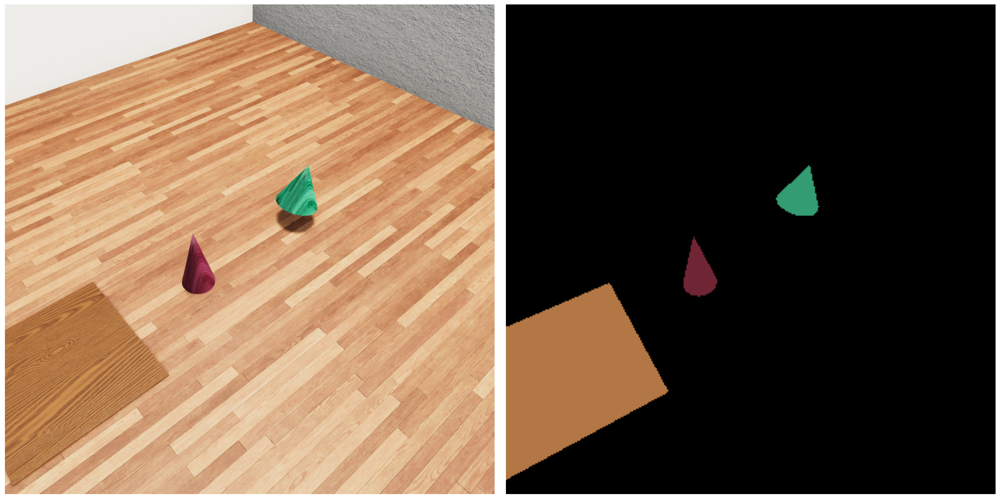

In [ ]:
# Create generators for the video frames
frames1 = img_arr

scenario_path = '/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/b3d_track_imgs'
frames2 = [
        np.array(Image.open(join(scenario_path, f'{config}_{trial_index.zfill(4)}_{i}.png')))
        for i in range(STOP_T)
    ]

height, width, _ = frames1[0].shape

# Adjust the figure size to match the aspect ratio of the combined videos
fig, axes = plt.subplots(1, 2, figsize=(2 * width / 100, height / 100), gridspec_kw={'wspace': 0, 'hspace': 0})

# # Initialize the figure
# fig, axes = plt.subplots(1, 2, gridspec_kw={'wspace': 0, 'hspace': 0})
ax1, ax2 = axes
ax1.axis('off')
ax2.axis('off')

# Initialize the images
im1 = ax1.imshow(frames1[0])
im2 = ax2.imshow(frames2[0])

# Update function for the animation
def update(frame):
    try:
        frame1 = frames1[frame]
        frame2 = frames2[frame]
        im1.set_data(frame1)
        im2.set_data(frame2)
    except StopIteration:
        anim.event_source.stop()  # Stop the animation when frames are exhausted

# Create the animation
anim = FuncAnimation(fig, update, frames=len(frames2), interval=100, repeat=False)

# Display the animation
plt.tight_layout()
plt.show()
anim.save("/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/videos/track.gif", writer="pillow")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


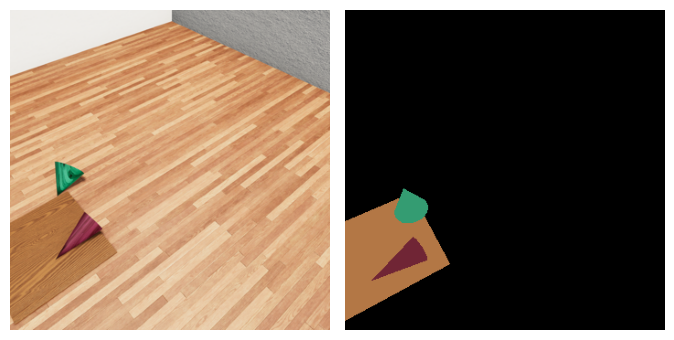

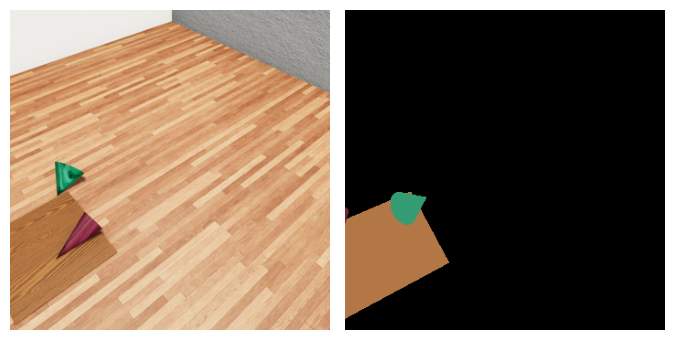

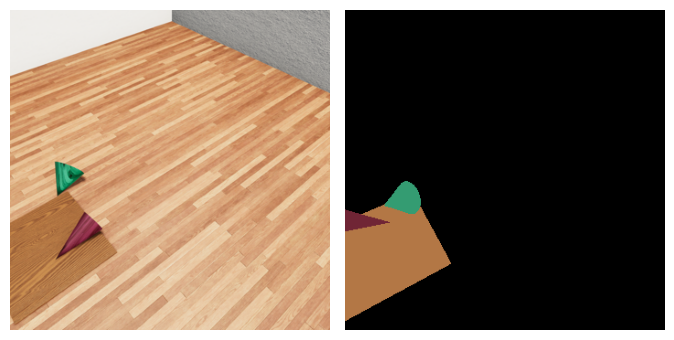

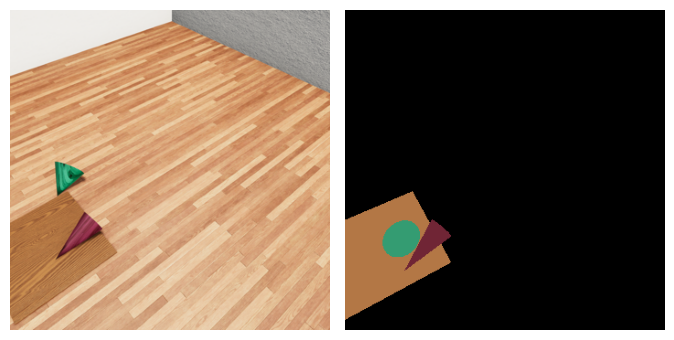

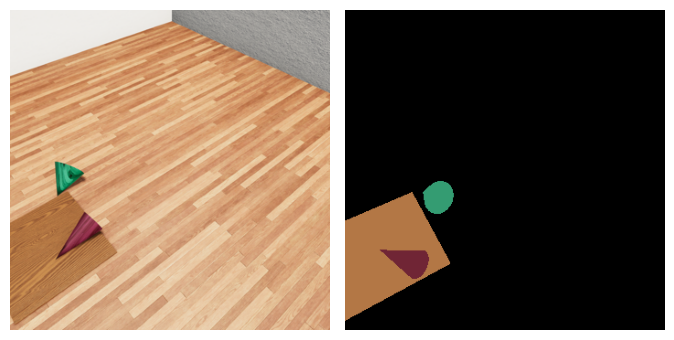

...

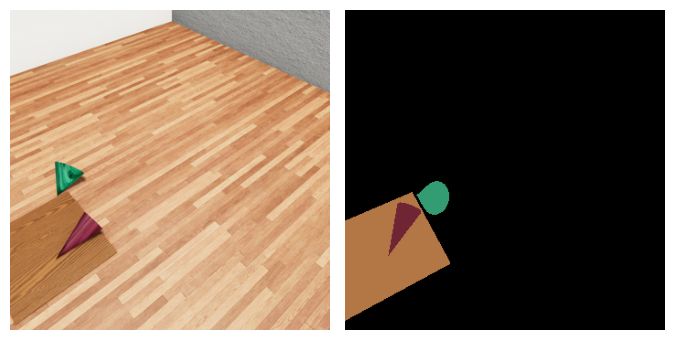

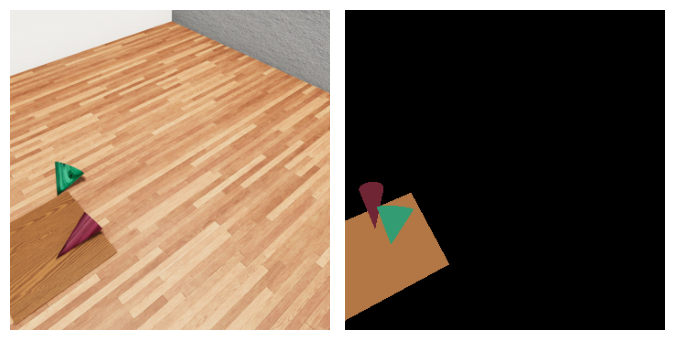

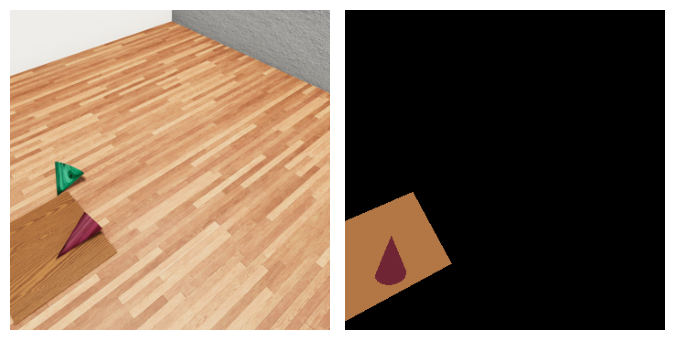

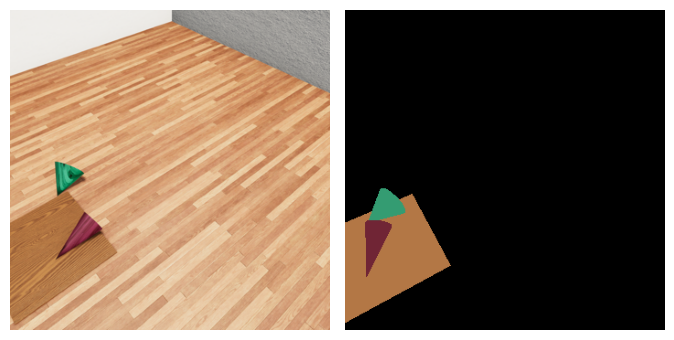

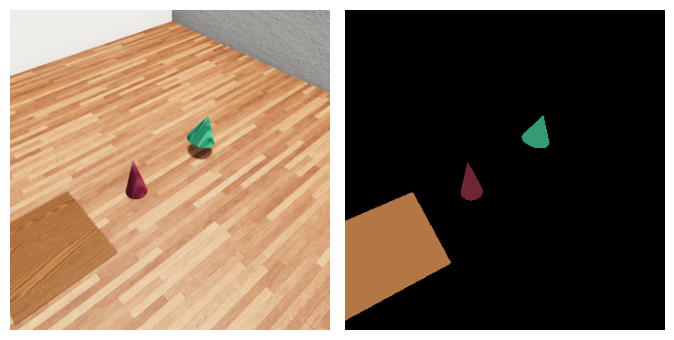

In [40]:
# Create generators for the video frames
num_frames = 150

frames1 = img_arr
height, width, _ = frames1[0].shape

track_path = '/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/b3d_track_imgs'
frames2_base = [
        np.array(Image.open(join(track_path, f'{config}_{trial_index.zfill(4)}_{i}.png')))
        for i in range(STOP_T)
    ]

for room in range(20):
    print(room)
    simulation_path = '/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/b3d_simulation_imgs/'
    frames2 = frames2_base + [np.array(Image.open(join(simulation_path, f'{config}_{trial_index.zfill(4)}_room{room}_frame{i}.png')))
            for i in range(num_frames)]

    # Adjust the figure size to match the aspect ratio of the combined videos
    fig, axes = plt.subplots(1, 2, figsize=(2 * width / 100, height / 100), gridspec_kw={'wspace': 0, 'hspace': 0})

    ax1, ax2 = axes
    ax1.axis('off')
    ax2.axis('off')

    # Initialize the images
    im1 = ax1.imshow(frames1[0])
    im2 = ax2.imshow(frames2[0])

    # Update function for the animation
    def update(frame):
    # try:
        frame1 = frames1[frame]
        frame2 = frames2[frame]
        im1.set_data(frame1)
        im2.set_data(frame2)
        # except StopIteration:
        #     anim.event_source.stop()  # Stop the animation when frames are exhausted

    # Create the animation
    anim = FuncAnimation(fig, update, frames=len(frames2), interval=100, repeat=False)

    # Display the animation
    # plt.show()
    plt.tight_layout()

    anim.save(f"/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/videos/track+simulation_{room}_w_gt.gif", writer="pillow")


0


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


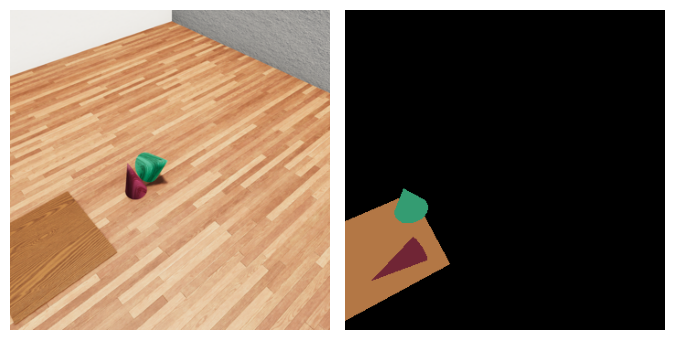

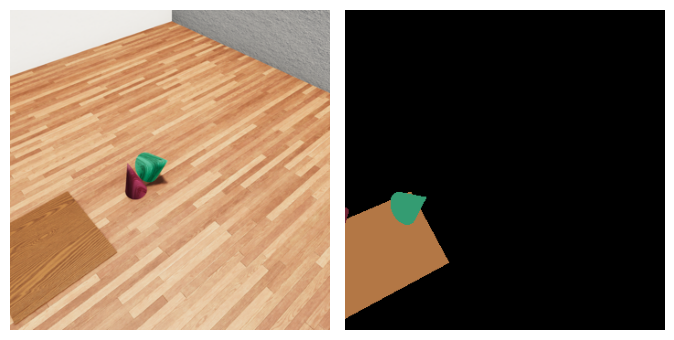

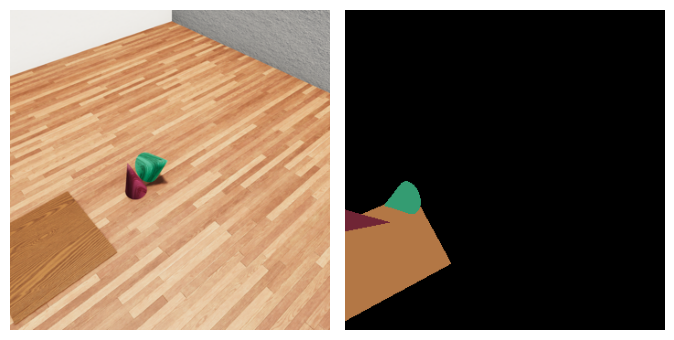

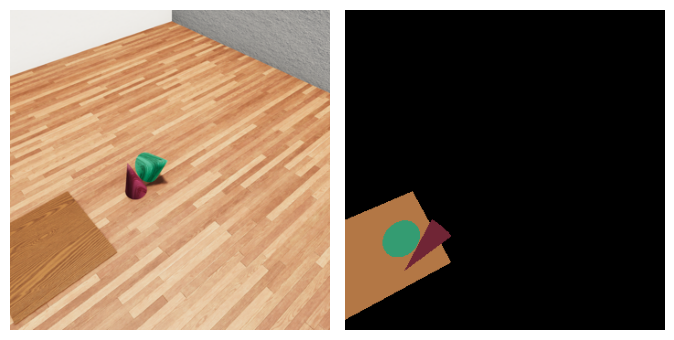

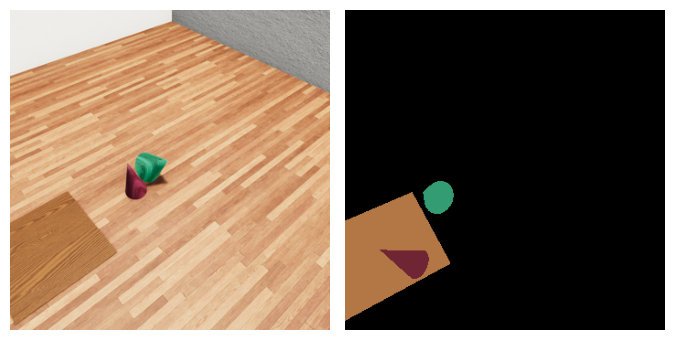

...

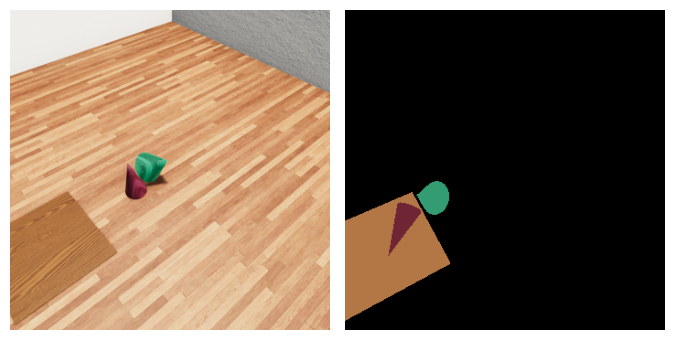

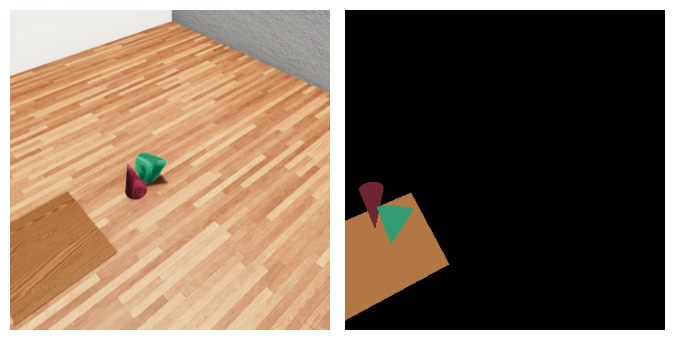

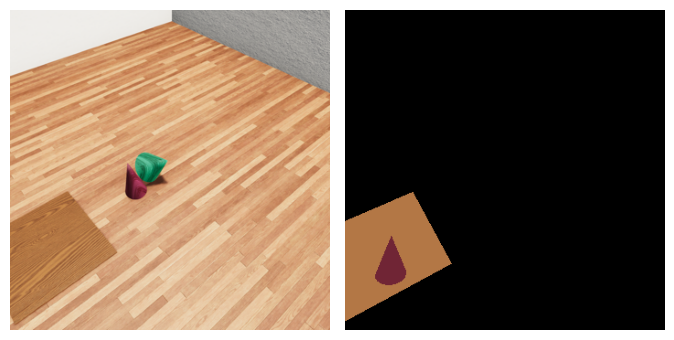

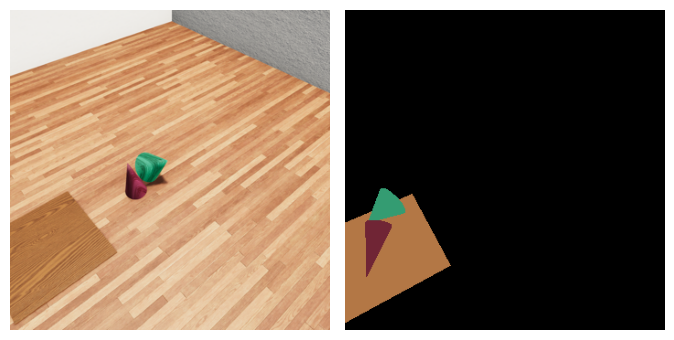

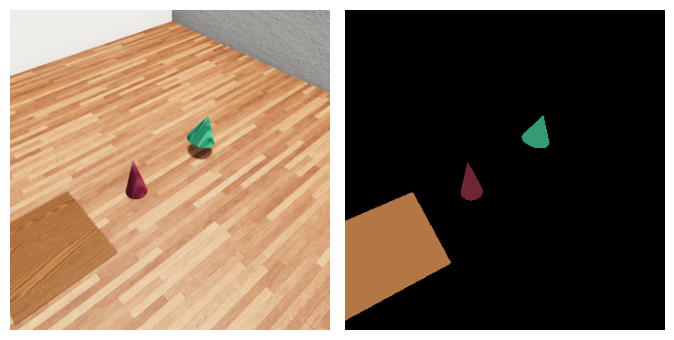

In [41]:
# Create generators for the video frames
num_frames = 150

frames1 = img_arr
height, width, _ = frames1[0].shape

track_path = '/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/b3d_track_imgs'
frames2_base = [
        np.array(Image.open(join(track_path, f'{config}_{trial_index.zfill(4)}_{i}.png')))
        for i in range(STOP_T)
    ]

for room in range(20):
    print(room)
    simulation_path = '/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/b3d_simulation_imgs/'
    frames2 = frames2_base+[np.array(Image.open(join(simulation_path, f'{config}_{trial_index.zfill(4)}_room{room}_frame{i}.png')))
            for i in range(num_frames)]

    # Initialize the figure
    fig, axes = plt.subplots(1, 2, figsize=(2 * width / 100, height / 100), gridspec_kw={'wspace': 0, 'hspace': 0})
    ax1, ax2 = axes
    ax1.axis('off')
    ax2.axis('off')

    # Initialize the images
    im1 = ax1.imshow(frames1[0])
    im2 = ax2.imshow(frames2[0])

    # Update function for the animation
    def update(frame):
    # try:
        if frame >= STOP_T:
            frame1 = frames1[STOP_T-1]
        else:
            frame1 = frames1[frame]
        frame2 = frames2[frame]
        im1.set_data(frame1)
        im2.set_data(frame2)
        # except StopIteration:
        #     anim.event_source.stop()  # Stop the animation when frames are exhausted

    # Create the animation
    anim = FuncAnimation(fig, update, frames=len(frames2), interval=100, repeat=False)

    # Display the animation
    # plt.show()
    plt.tight_layout()

    anim.save(f"/home/haw027/code/private-physics-bench/stimuli/stimuli/generation/placement/videos/track+simulation_{room}_wo_gt.gif", writer="pillow")